In [1]:
%pip install opencv-python numpy pandas matplotlib seaborn scikit-learn tqdm gdown albumentations torchmetrics[detection] pycocotools

Note: you may need to restart the kernel to use updated packages.


# 1. Инициализация среды и Конфигурация эксперимента

Начальный этап проекта посвящен развертыванию программного стека и определению глобальной стратегии обучения. Учитывая сложность датасета `VisDrone`, мы закладываем фундамент для эффективной работы с памятью и воспроизводимости результатов.

## 1.1 Импорт библиотек и Настройка окружения

Архитектурный фундамент проекта строится на модульной экосистеме **PyTorch** и расширенном инструментарии **Albumentations**. Выбор данного стека обусловлен необходимостью контроля над компонентами детектора: от кастомизации `RPN` до тонкой настройки `RoIAlign`, что критично при работе с нестандартными объектами.

Для обеспечения методологической чистоты эксперимента интегрирована библиотека `torchmetrics`. Её алгоритмы расчета **mAP** полностью соответствуют протоколам COCO, что гарантирует научную достоверность и сопоставимость результатов с современными SOTA решениями.

Особое внимание уделено оптимизации вычислений. Использование `GradScaler` позволяет реализовать обучение со смешанной точностью (**Mixed Precision**), существенно снижая нагрузку на видеопамять без потери точности градиентов.

In [2]:
import os
import gc
import sys
import json
import zipfile
import gdown
import time
from datetime import datetime
import math
import random
import traceback
from pathlib import Path
from collections import defaultdict, OrderedDict
from typing import Dict, List, Optional, Type, Any, Tuple

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns
from sklearn.cluster import KMeans
from tqdm.auto import tqdm

from albumentations.pytorch import ToTensorV2
import albumentations as A
import torch
import torch.nn.functional as F
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, Subset

from torch.cuda.amp import GradScaler, autocast

from torch.optim.lr_scheduler import (
    LinearLR,
    CosineAnnealingLR,
    SequentialLR
)

import torchvision
import torchvision.ops as ops
from torchvision.ops import box_iou
from torchvision.ops import MultiScaleRoIAlign
from torchvision.ops import boxes as box_ops
from torchvision.ops import sigmoid_focal_loss

from torchvision.models.detection import RetinaNet, FasterRCNN
from torchvision.models.detection.retinanet import RetinaNetHead
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone

from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.rpn import AnchorGenerator, RPNHead, RegionProposalNetwork
from torchvision.models.detection.roi_heads import RoIHeads
from torchvision.models.detection.transform import GeneralizedRCNNTransform
from torchvision.models.detection.backbone_utils import BackboneWithFPN

from torchvision.ops.feature_pyramid_network import (
    FeaturePyramidNetwork,
    LastLevelP6P7,
    LastLevelMaxPool,
    ExtraFPNBlock
)

from torchmetrics.detection.mean_ap import MeanAveragePrecision

## 1.2 Глобальная конфигурация

Стратегия конфигурации напрямую продиктована спецификой детекции малых объектов. Входное разрешение **1024px** выбрано как необходимый минимум для сохранения семантической плотности данных. При стандартных размерах в 640px объекты размером менее 15-20 пикселей физически нивелируются после прохождения через бэкбон со страйдом 32.

Ключевые аспекты настройки:

* **Адаптивные якоря (Anchors):** Сетка, начинающаяся с 11 пикселей, отражает реальное распределение размеров объектов в `VisDrone`. Использование дефолтных параметров COCO привело бы к невозможности обучения детектора на мелком транспорте.
* **Стабильность градиентов:** Оптимизатор `SGD` с раздельным механизмом затухания весов дополнен жестким ограничением норм градиентов (`max_grad_norm`). Это предотвращает расходимость модели на ранних этапах, когда ошибки локализации наиболее велики.
* **Эффективность обучения:** Параметры `warmup_epochs` и `CosineAnnealingLR` обеспечивают плавный вход в пространство признаков и качественную дообучаемость на финальных стадиях.

In [3]:
CONFIG = {
    "num_classes": 9,
    "min_box_area": 4.0,
    "img_size": 1024,
    "max_img_size": 1333,

    "batch_size": 32,
    "num_epochs": 40,
    "learning_rate": 0.02,
    "weight_decay": 0.0005,
    "momentum": 0.9,
    "max_grad_norm": 10.0,
    "warmup_epochs": 5,

    "anchor_sizes": (
        (11, 14, 18),
        (23, 29, 36),
        (45, 57, 72),
        (90, 113, 143),
        (180, 226, 286)
    ),

    "aspect_ratios": ((0.5, 1.0, 2.0),) * 5,

    "num_workers": 8,
    "seed": 42,
    "device": torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu'),
    "workspace_dir": Path("/workspace"),
    "data_dir": Path("/workspace/data"),
    "checkpoint_dir": Path("/workspace/checkpoints")
}

## 1.3 Инициализация среды и Загрузка данных

В исследованиях воспроизводимость является единственным мерилом достоверности гипотез. Метод `seed_everything` детерминирует начальные состояния генераторов случайных чисел, позволяя фиксировать вклад каждой архитектурной модификации в итоговую метрику.

Программная подготовка рабочего пространства и автоматизация загрузки данных исключает ручные операции с файловой системой и гарантирует целостность данных перед началом обучения.

Строгое разделение путей для тренировочной и валидационной выборок на этапе инициализации предотвращает риск утечки данных (`data leakage`) и обеспечивает корректную работу загрузчиков при любых изменениях в структуре проекта.


In [4]:
def seed_everything(seed: int) -> None:
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = False
        torch.backends.cudnn.benchmark = True

seed_everything(CONFIG["seed"])
print(f"[Инициализация] Устройство: {CONFIG['device']} | Seed: {CONFIG['seed']}")

[Инициализация] Устройство: cuda | Seed: 42


In [5]:
ARCHIVE_NAME = "data.zip"
GDRIVE_FILE_ID = "1Orlk5QBETGj8TP-MXlvIM43wO9QQ6tym"

In [6]:
def setup_workspace():
    work_dir = CONFIG["workspace_dir"]
    data_dir = CONFIG["data_dir"]
    ckpt_dir = CONFIG["checkpoint_dir"]

    print(f"Проверка окружения...")
    ckpt_dir.mkdir(parents=True, exist_ok=True)

    if not Path(ARCHIVE_NAME).exists() and not data_dir.exists():
        print(f"Скачивание {ARCHIVE_NAME}...")
        url = f'https://drive.google.com/uc?id={GDRIVE_FILE_ID}'
        gdown.download(url, ARCHIVE_NAME, quiet=False)

    is_data_exists = data_dir.exists() and any(data_dir.iterdir())

    if not is_data_exists:
        print(f"Данных нет. Распаковка...")
        try:
            with zipfile.ZipFile(ARCHIVE_NAME, 'r') as zip_ref:
                zip_ref.extractall(work_dir)
            print("Распаковка завершена.")
            os.remove(ARCHIVE_NAME)
        except Exception as e:
            print(f"Ошибка распаковки: {e}")
    else:
        print(f"Данные уже распакованы в {data_dir}.")

setup_workspace()

Проверка окружения...
Данные уже распакованы в /workspace/data.


In [7]:
TRAIN_IMAGES = CONFIG["data_dir"] / "train/images"
TRAIN_ANNOTATIONS = CONFIG["data_dir"] / "train/annotations"
VAL_IMAGES = CONFIG["data_dir"] / "validation/images"
VAL_ANNOTATIONS = CONFIG["data_dir"] / "validation/annotations"

# 2. Подготовка данных и Аугментации

## 2.1 Организация системы классов и логика переназначения меток

Исходный набор данных содержит избыточное количество категорий, многие из которых не относятся к транспортным средствам. Для повышения качества обучения мы фокусируем внимание модели только на целевой группе объектов, проводя процедуру переназначения (маппинга) индексов.

В рамках этой логики мы исключаем классы, не относящиеся к транспорту, переводя их в разряд фона. Индекс 0 строго закрепляется за фоновым классом, что является фундаментальным требованием для корректной работы классификатора внутри детектора.

In [8]:
CLASS_MAPPING: Dict[int, int] = {
        3: 1, 4: 2, 5: 3, 6: 4, 7: 5, 8: 6, 9: 7, 10: 8
    }

CLASS_NAMES: List[str] = [
        "background", "bicycle", "car", "van", "truck",
        "tricycle", "awning-tricycle", "bus", "motor",
    ]

## 2.2 Архитектура класса VisDroneDataset

Класс `VisDroneDataset` спроектирован с упором на отказоустойчивость и методологическую чистоту обучения. В отличие от стандартных загрузчиков, здесь реализованы механизмы пре-фильтрации и динамической валидации данных.

**Ключевые решения:**

* **Стабилизация градиента через индексацию:** Метод `_build_index` выполняет предварительный проход по аннотациям. Исключение пустых изображений из тренировочного сплита предотвращает "холостые" итерации, которые в задачах детекции малых объектов могут привести к коллапсу модели в сторону предсказания только фона.
* **Многоступенчатая валидация (Sanity Check):** Метод `_is_box_valid` отсекает боксы с некорректной геометрией (площадь менее 4 пикселей) и не целевые объекты. Это гарантирует, что функция потерь будет вычисляться только на качественных и необходимых данных.
* **Защита от runtime-ошибок:** В `__getitem__` реализована рекурсивная обработка битых файлов и принудительное ограничение координат (`clamping`). Это критично при использовании агрессивных геометрических аугментаций, способных вынести границы объекта за пределы кадра.

In [9]:
class VisDroneDataset(Dataset):
    def __init__(
        self,
        images_dir: Path,
        annotations_dir: Path,
        split: str = "train",
        transforms: Optional[A.Compose] = None,
        filter_empty_samples: bool = True,
        min_box_area: float = 4.0,
        verbose: bool = True,
    ) -> None:
        self.images_dir = Path(images_dir)
        self.annotations_dir = Path(annotations_dir)
        self.split = split
        self.transforms = transforms
        self.min_box_area = float(min_box_area)
        self.verbose = bool(verbose)

        if self.split == "train" and self.transforms is None:
            raise ValueError("Тренировочный датасет должен быть инициализирован с аугментациями")

        self.should_filter_empty = (self.split == "train") and filter_empty_samples

        if not self.images_dir.exists():
            raise FileNotFoundError(f"Директория изображений не найдена: {self.images_dir}")

        self.all_images_paths = sorted(
            [p for p in self.images_dir.iterdir() if p.suffix.lower() in {".jpg", ".jpeg", ".png"}]
        )
        if not self.all_images_paths:
            raise RuntimeError(f"Изображения не найдены в {self.images_dir}")

        self.filename_to_id = {p.stem: i for i, p in enumerate(self.all_images_paths)}

        self.valid_files = self._build_index()

        if self.verbose:
            print(f"[Dataset] Сплит: {self.split} | Валидных сэмплов: {len(self.valid_files)}")

    def _is_box_valid(self, width: float, height: float, score: int, category_id: int) -> bool:
        if score == 0:
          return False
        if category_id not in CLASS_MAPPING:
          return False
        if width <= 1 or height <= 1:
          return False
        if (width * height) < self.min_box_area:
          return False
        return True

    def _read_annotation_file(self, ann_path: Path) -> Tuple[List[List[float]], List[int]]:
        boxes, labels = [], []

        if not ann_path.exists():
            return boxes, labels

        try:
            with ann_path.open("r") as f:
                for line in f:
                    parts = line.strip().split(",")
                    if len(parts) < 8: continue
                    try:
                        x_min, y_min = float(parts[0]), float(parts[1])
                        w, h = float(parts[2]), float(parts[3])
                        score = int(parts[4])
                        category = int(parts[5])

                        if self._is_box_valid(w, h, score, category):
                            boxes.append([x_min, y_min, x_min + w, y_min + h])
                            labels.append(CLASS_MAPPING[category])

                    except ValueError:
                        continue
        except Exception:
            pass

        return boxes, labels

    def _build_index(self) -> List[Path]:
        if not self.should_filter_empty:
            return self.all_images_paths

        valid_paths = []
        for img_path in self.all_images_paths:
            ann_path = self.annotations_dir / f"{img_path.stem}.txt"
            boxes, _ = self._read_annotation_file(ann_path)

            if len(boxes) > 0:
                valid_paths.append(img_path)

        if not valid_paths:
            raise RuntimeError("Датасет пуст после фильтрации! Проверьте пути к аннотациям.")
        return valid_paths

    def __len__(self) -> int:
        return len(self.valid_files)

    def __getitem__(self, idx: int) -> Tuple[torch.Tensor, Dict[str, torch.Tensor]]:
        img_path = self.valid_files[idx]
        ann_path = self.annotations_dir / f"{img_path.stem}.txt"

        image = cv2.imread(str(img_path), cv2.IMREAD_COLOR)
        if image is None:
            if self.verbose:
                print(f"[Внимание] Поврежденное изображение: {img_path}. Пропуск.")
            return self.__getitem__((idx + 1) % len(self))

        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        boxes_list, labels_list = self._read_annotation_file(ann_path)

        boxes_np = np.asarray(boxes_list, dtype=np.float32).reshape(-1, 4)
        labels_np = np.asarray(labels_list, dtype=np.int64)

        if self.transforms is not None:
            try:
                transformed = self.transforms(image=image, bboxes=boxes_np, labels=labels_np)
                image_tensor = transformed['image']
                boxes_np = np.asarray(transformed['bboxes'], dtype=np.float32).reshape(-1, 4)
                labels_np = np.asarray(transformed['labels'], dtype=np.int64)
            except Exception as e:
                if self.verbose:
                    print(f"[Ошибка аугментации] {img_path}: {e}")
                return self.__getitem__((idx + 1) % len(self))
        else:
            image_tensor = ToTensorV2()(image=image)["image"]
            image_tensor = image_tensor.float() / 255.0

        boxes_t = torch.as_tensor(boxes_np, dtype=torch.float32).reshape(-1, 4)
        labels_t = torch.as_tensor(labels_np, dtype=torch.int64)
        image_id = torch.tensor([self.filename_to_id[img_path.stem]], dtype=torch.int64)

        if boxes_t.numel() > 0:
            _, h_cur, w_cur = image_tensor.shape

            boxes_t[:, 0].clamp_(0, w_cur)
            boxes_t[:, 1].clamp_(0, h_cur)
            boxes_t[:, 2].clamp_(0, w_cur)
            boxes_t[:, 3].clamp_(0, h_cur)

            box_w = boxes_t[:, 2] - boxes_t[:, 0]
            box_h = boxes_t[:, 3] - boxes_t[:, 1]

            keep = (box_w > 1) & (box_h > 1) & ((box_w * box_h) >= self.min_box_area)

            boxes_t = boxes_t[keep]
            labels_t = labels_t[keep]

        if boxes_t.numel() > 0:
            area_t = (boxes_t[:, 2] - boxes_t[:, 0]) * (boxes_t[:, 3] - boxes_t[:, 1])
        else:
            area_t = torch.zeros((0,), dtype=torch.float32)

        target = {
            "boxes": boxes_t,
            "labels": labels_t,
            "image_id": image_id,
            "area": area_t,
            "iscrowd": torch.zeros((len(labels_t),), dtype=torch.int64)
        }

        return image_tensor, target

## 2.3 Кастомная функция объединения

Поскольку на каждом кадре `VisDrone` находится разное количество объектов, стандартная упаковка данных в тензоры PyTorch невозможна.

* **Логика упаковки:** Мы используем `zip` для разделения изображений и аннотаций. Изображения собираются в батч, а аннотации передаются в виде кортежа словарей, что позволяет модели корректно обрабатывать списки объектов разной длины.


In [10]:
def collate_fn(batch):
    return tuple(zip(*batch))

## 2.4 Стратегия многоступенчатой аугментации

Конфигурация трансформаций реализует сложную стратегию подготовки изображения, имитирующую динамику полета БПЛА и технические особенности камер.

**Логика тренировочных преобразований:**

* **Комбинированное кадрирование (Pad & Crop):** Использование связки `PadIfNeeded` и `RandomCrop` позволяет подавать в сеть фрагменты фиксированного размера (), сохраняя при этом исходную детализацию мелких объектов. Это эффективнее простого сжатия, при котором мелкие машины могут превратиться в неразличимые пятна.
* **Имитация динамики полета (Affine):** Группа аффинных преобразований (небольшие сдвиги, масштабирование от 0.9 до 1.1 и повороты) обучает модель инвариантности к высоте полета и вибрациям дрона. Это критично для стабильной детекции при изменении ракурса съемки.
* **Устойчивость к визуальным дефектам:** Блоки `MotionBlur` и `Blur` имитируют "смаз" изображения при движении аппарата, а `CLAHE` (адаптивное выравнивание гистограммы) помогает модели распознавать транспорт в глубоких тенях или при пересвете, что часто встречается при аэросъемке в разное время суток.

**Протокол валидации и обработки рамок:**

* **Сохранение пропорций (Letterboxing):** При валидации используется `LongestMaxSize` с последующим дополнением краев (`PadIfNeeded`). Это гарантирует, что форма объектов не будет искажена при приведении к рабочему разрешению модели, что жизненно важно для точной работы регрессора координат.
* **Контроль видимости и формата:** Мы работаем с форматом **Pascal VOC** ($x_{min}, y_{min}, x_{max}, y_{max}$), который наиболее прозрачен для отладки. Параметр `min_visibility=0.1` гарантирует, что в выборку попадут только те объекты, которые сохранили хотя бы 10% своей площади после всех случайных поворотов и сдвигов.


In [11]:
def get_transforms(train: bool, img_size: int = 1024) -> A.Compose:
    transforms = []

    if train:
        transforms.extend([
            A.PadIfNeeded(
                min_height=img_size,
                min_width=img_size,
                border_mode=cv2.BORDER_CONSTANT,
                fill_value=0,
                position='center'
            ),
            A.RandomCrop(height=img_size, width=img_size),
            A.HorizontalFlip(p=0.5),

            A.Affine(
                translate_percent={"x": (-0.05, 0.05), "y": (-0.05, 0.05)},
                scale=(0.9, 1.1),
                rotate=(-10, 10),
                mode=cv2.BORDER_CONSTANT,
                cval=0,
                p=0.5
            ),

            A.OneOf([
                A.MotionBlur(p=1.0),
                A.Blur(blur_limit=3, p=1.0),
            ], p=0.2),

            A.OneOf([
                A.CLAHE(clip_limit=2.0, p=1.0),
                A.RandomBrightnessContrast(p=1.0),
            ], p=0.4),
        ])

    else:
        transforms.extend([
            A.LongestMaxSize(max_size=img_size),
            A.PadIfNeeded(
                min_height=img_size,
                min_width=img_size,
                border_mode=cv2.BORDER_CONSTANT,
                fill_value=0,
                position='center'
            ),
        ])

    transforms.extend([
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2()
    ])

    return A.Compose(transforms, bbox_params=A.BboxParams(
        format='pascal_voc',
        label_fields=['labels'],
        min_visibility=0.1,
        clip=True
    ))

# 3. Формирование загрузчиков и верификация данных

Этот этап связывает воедино подготовленные классы данных и архитектуру обучения. Мы настраиваем пайплайн так, чтобы минимизировать простои вычислительных узлов и гарантировать высокое качество входных признаков.

## 3.1 Конфигурация выборок и стратегия фильтрации

Создание раздельных экземпляров `VisDroneDataset` для обучения и валидации позволяет реализовать разные стратегии обработки данных. В тренировочном наборе мы применяем строгую фильтрацию пустых кадров (`filter_empty_samples`). Это осознанный шаг: в условиях высокой плотности объектов в VisDrone, обучение на кадрах без целевых классов приводит к избыточному накоплению градиентов от фоновых регионов, что может замедлить сходимость.

Параметр `min_box_area` выступает в роли первого уровня защиты от "шумовых" объектов. Мы игнорируем элементы площадью менее 4 пикселей, основываясь на математическом пределе разрешающей способности глубоких сетей. Поскольку стандартные бэкбоны имеют итоговый страйд (шаг) равный 32, объекты такого размера физически не могут сформировать значимый отклик на финальных картах признаков, и их исключение снижает количество ложноотрицательных срабатываний при расчете функции потерь.

In [12]:
train_dataset = VisDroneDataset(
    images_dir=TRAIN_IMAGES,
    annotations_dir=TRAIN_ANNOTATIONS,
    split='train',
    transforms=get_transforms(train=True, img_size=CONFIG["img_size"]),
    filter_empty_samples=True,
    min_box_area=CONFIG["min_box_area"]
)

val_dataset = VisDroneDataset(
    images_dir=VAL_IMAGES,
    annotations_dir=VAL_ANNOTATIONS,
    split='val',
    transforms=get_transforms(train=False, img_size=CONFIG["img_size"]),
    filter_empty_samples=False,
    min_box_area=CONFIG["min_box_area"]
)

/tmp/ipykernel_5414/566137477.py:6: UserWarning: Argument(s) 'fill_value' are not valid for transform PadIfNeeded
  A.PadIfNeeded(
/tmp/ipykernel_5414/566137477.py:16: UserWarning: Argument(s) 'mode, cval' are not valid for transform Affine
  A.Affine(


[Dataset] Сплит: train | Валидных сэмплов: 6323
[Dataset] Сплит: val | Валидных сэмплов: 548


/tmp/ipykernel_5414/566137477.py:39: UserWarning: Argument(s) 'fill_value' are not valid for transform PadIfNeeded
  A.PadIfNeeded(


## 3.2 Оптимизация потоковой передачи данных

Настройка `DataLoader` направлена на решение проблемы узкого места (bottleneck), возникающего при чтении и десериализации тяжелых изображений высокого разрешения ().

**Механизмы обеспечения производительности:**

* **Асинхронная подготовка батчей:** Использование `num_workers` в сочетании с `prefetch_factor=2` позволяет процессору готовить следующие порции данных параллельно с вычислениями на ускорителе. Это обеспечивает непрерывность цикла обучения.
* **Оптимизация обмена памятью:** Флаг `pin_memory` задействует механизм прямого доступа к памяти, ускоряя передачу тензоров из оперативной памяти в память ускорителя. Это критически важно для поддержания высокой частоты итераций при работе с большими батчами.
* **Управление жизненным циклом процессов:** Параметр `persistent_workers` предотвращает дорогостоящую процедуру пересоздания процессов после каждой эпохи, сохраняя ресурсы для основных вычислений.

In [13]:
use_cuda_pin = (CONFIG["device"].type == 'cuda')

In [14]:
train_loader = DataLoader(
    train_dataset,
    batch_size=CONFIG["batch_size"],
    shuffle=True,
    num_workers=CONFIG["num_workers"],
    collate_fn=collate_fn,
    pin_memory=use_cuda_pin,
    persistent_workers=(CONFIG["num_workers"] > 0),
    prefetch_factor=2 if CONFIG["num_workers"] > 0 else None
)

val_loader = DataLoader(
    val_dataset,
    batch_size=CONFIG["batch_size"],
    shuffle=False,
    num_workers=CONFIG["num_workers"],
    collate_fn=collate_fn,
    pin_memory=use_cuda_pin,
    persistent_workers=(CONFIG["num_workers"] > 0),
    prefetch_factor=2 if CONFIG["num_workers"] > 0 else None
)

In [15]:
print(f"[Загрузчики] Батчей на трейн: {len(train_loader)} | Батчей на валидацию: {len(val_loader)}")

[Загрузчики] Батчей на трейн: 198 | Батчей на валидацию: 18


## 3.3 Визуальная проверка

Прежде чем запускать обучение на несколько часов, мы проводим "проверку на адекватность", чтобы убедиться, что данные и разметка не испорчены.

* **Обработка цвета:** Функция `denormalize_image` возвращает картинку из формата ImageNet в обычный вид. Так мы можем глазами оценить качество входных данных.
* **Контроль рамок (BBox):** Через `visualize_batch` мы проверяем, что рамки объектов (`boxes`) не сместились после поворотов или изменения размера. Важно убедиться, что подписи из `CLASS_NAMES` (машины, пешеходы и т.д.) стоят именно там, где находятся реальные объекты.

In [16]:
def denormalize_image(tensor):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])

    img = tensor.permute(1, 2, 0).cpu().numpy()
    img = (img * std) + mean
    return np.clip(img, 0, 1)

In [17]:
def visualize_batch(loader, num_images=4):
    cmap = plt.get_cmap('tab10')
    class_colors = {i: cmap(i / len(CLASS_NAMES)) for i in range(len(CLASS_NAMES))}

    images, targets = next(iter(loader))
    batch_size = len(images)
    samples_to_show = min(batch_size, num_images)

    cols = 2
    rows = math.ceil(samples_to_show / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(20, 10 * rows), constrained_layout=True)
    if samples_to_show == 1: axes = [axes]
    axes = np.array(axes).flatten()

    print(f"\n[Sanity Check] Визуализация {samples_to_show} примеров из DataLoader...")

    for idx in range(samples_to_show):
        ax = axes[idx]

        img_np = denormalize_image(images[idx])
        ax.imshow(img_np)

        boxes = targets[idx]['boxes'].cpu().numpy()
        labels = targets[idx]['labels'].cpu().numpy()

        for box, label_idx in zip(boxes, labels):
            x1, y1, x2, y2 = box
            w, h = x2 - x1, y2 - y1

            color = class_colors.get(label_idx, (1, 0, 0))
            class_name = CLASS_NAMES[label_idx] if label_idx < len(CLASS_NAMES) else str(label_idx)

            rect = patches.Rectangle((x1, y1), w, h, linewidth=2, edgecolor=color, facecolor='none', alpha=0.9)
            ax.add_patch(rect)

            ax.text(x1, y1 - 5, class_name, color='white', fontsize=10, fontweight='bold',
                    bbox=dict(facecolor=color, edgecolor='none', alpha=0.8, pad=1))

        ax.set_title(f"Sample {idx} | Objects: {len(boxes)}")
        ax.axis('off')

    for ax in axes[samples_to_show:]:
        ax.axis('off')

    plt.show()


[Sanity Check] Визуализация 4 примеров из DataLoader...


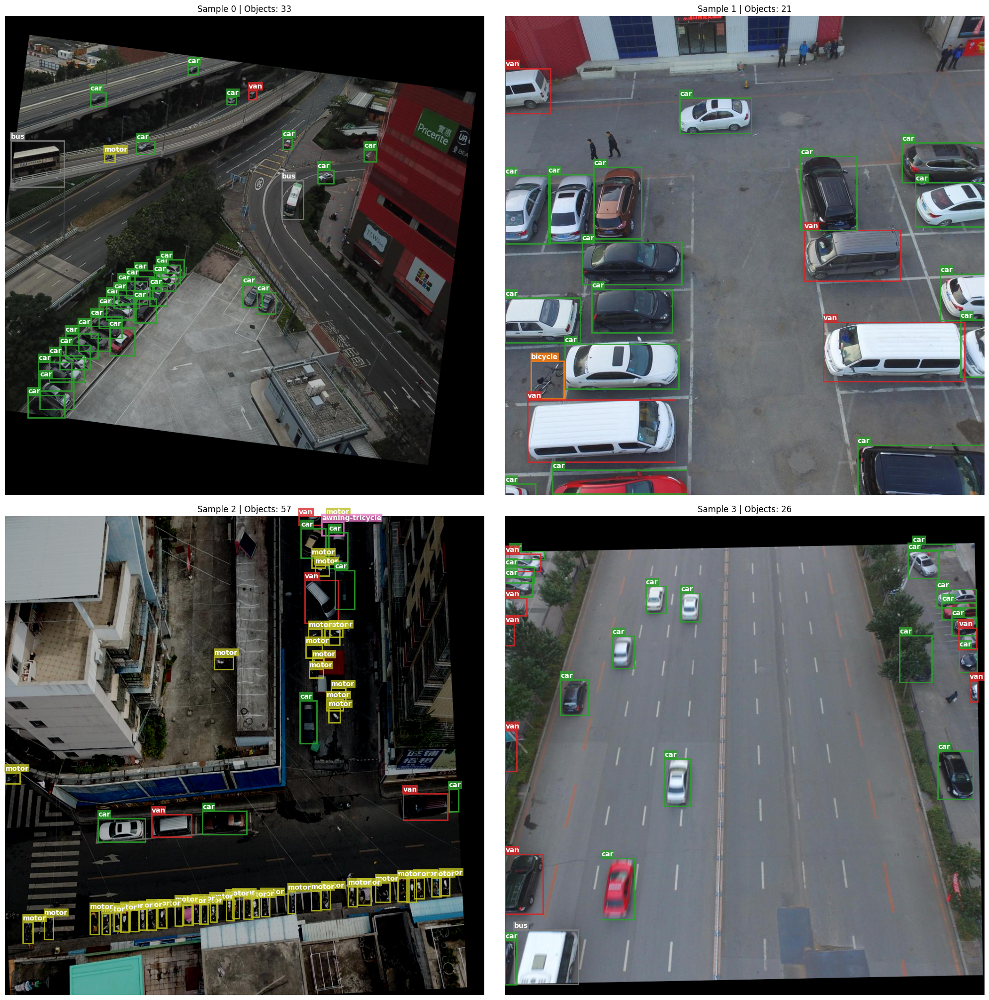

In [18]:
visualize_batch(train_loader, num_images=4)

# 4. Разведочный анализ данных (EDA) и стратегия адаптации

Перед проектированием архитектуры детектора необходимо провести глубокий аудит данных. Цель этого этапа — выявить статистические закономерности датасета `VisDrone`, которые определят выбор гиперпараметров сети,  конфигурации якорей (`anchors`) и другие настройки.



## 4.1 Сбор статистических параметров (`collect_eda_stats`)

Эта функция выполняет первичный проход по аннотациям для извлечения геометрических и распределительных характеристик объектов.

* **Выборочный анализ:** Мы используем случайную выборку в 100% (`sample_ratio=1`).
* **Параметры сбора:** Мы фиксируем не только размеры (`w`, `h`), но и координаты центров, соотношение сторон (`aspect ratio`) и плотность объектов на кадр. Эти данные позволят нам в дальнейшем точно настроить форму якорей (`anchors`) и алгоритмы аугментации.

In [19]:
def collect_eda_stats(dataset, sample_ratio=0.3):
    print(f"[EDA] Сканирование датасета ({int(sample_ratio * 100)}%)...")

    stats = {
        "widths": [],
        "heights": [],
        "areas": [],
        "aspect_ratios": [],
        "centers_x": [],
        "centers_y": [],
        "labels": [],
        "objects_per_img": [],
        "all_boxes": []
    }

    indices = np.random.choice(len(dataset), int(len(dataset) * sample_ratio), replace=False)

    for idx in tqdm(indices):
        try:
            _, target = dataset[idx]
            boxes = target["boxes"].numpy()
            labels = target["labels"].numpy()

            if len(boxes) == 0:
                stats["objects_per_img"].append(0)
                continue

            stats["objects_per_img"].append(len(boxes))
            stats["labels"].extend(labels)
            stats["all_boxes"].append(torch.tensor(boxes))

            x1 = boxes[:, 0]
            y1 = boxes[:, 1]
            x2 = boxes[:, 2]
            y2 = boxes[:, 3]

            w = np.abs(x2 - x1)
            h = np.abs(y2 - y1)

            area = w * h
            ar = w / (h + 1e-6)

            cx = (x1 + x2) / 2
            cy = (y1 + y2) / 2

            stats["widths"].extend(w)
            stats["heights"].extend(h)
            stats["areas"].extend(area)
            stats["aspect_ratios"].extend(ar)
            stats["centers_x"].extend(cx)
            stats["centers_y"].extend(cy)

        except Exception as e:
            continue

    return stats

## 4.2 Анализ и визуализация

В данном блоке накопленная статистика превращается в конкретные инженерные выводы и графики.

* **Оптимизация якорей (`K-Means`):** Мы не используем стандартные размеры `anchors` "из коробки". Алгоритм кластеризации `K-Means` находит наиболее типичные формы объектов именно для этого датасета. Эти центроиды станут базовыми размерами для нашей сети.
* **Анализ перекрытий (`IoU`):** Мы вычисляем матрицу пересечений между объектами на одном кадре. В условиях плотной городской застройки и пробок это поможет нам правильно настроить пороги алгоритма `NMS` (Non-Maximum Suppression), чтобы модель не удаляла реальные объекты, стоящие вплотную.
* **Масштабирование (COCO Metrics):** Объекты разбиваются на группы: мелкие (< ), средние и крупные. Это позволяет заранее увидеть, на каком масштабе модель будет испытывать наибольшие трудности.

In [20]:
def analyze_and_plot(stats):
    sns.set_theme(style="whitegrid", context="paper", font_scale=1.1)

    COLORMAP = "viridis"
    main_palette = sns.color_palette(COLORMAP, n_colors=8)

    COLOR_DISTRIBUTION = main_palette[3]
    COLOR_SAMPLES = main_palette[2]
    COLOR_PIE_CHART = [main_palette[2], main_palette[4], main_palette[6]]
    COLOR_ACCENT = '#d62728'

    print(f"\n[Анализ] Обработка статистики для {len(stats['widths'])} объектов...")

    widths = np.array(stats["widths"])
    heights = np.array(stats["heights"])
    areas = np.array(stats["areas"])
    aspect_ratios = np.array(stats["aspect_ratios"])
    labels = np.array(stats["labels"])
    objects_per_img = stats["objects_per_img"]

    wh = np.column_stack((widths, heights))
    kmeans = KMeans(n_clusters=5, random_state=42, n_init=10).fit(wh)
    anchors = kmeans.cluster_centers_
    anchors = anchors[np.argsort(anchors[:, 0] * anchors[:, 1])]

    n_small = np.sum(areas < 32**2)
    n_medium = np.sum((areas >= 32**2) & (areas < 96**2))
    n_large = np.sum(areas >= 96**2)

    iou_scores = []
    if "all_boxes" in stats:
        for boxes in stats["all_boxes"]:
            if len(boxes) > 1:
                iou_matrix = box_iou(boxes, boxes)
                iou_matrix.fill_diagonal_(0)
                max_iou, _ = iou_matrix.max(dim=1)
                iou_scores.extend(max_iou.numpy())
    iou_scores = np.array(iou_scores) if iou_scores else np.array([])

    fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(26, 13), constrained_layout=True)

    ax1 = axes[0, 0]
    x_lim = np.percentile(widths, 99.9)
    y_lim = np.percentile(heights, 99.9)

    ax1.scatter(widths, heights, alpha=0.2, s=10, color=COLOR_SAMPLES, label='Объекты', rasterized=True)
    ax1.scatter(anchors[:, 0], anchors[:, 1], color=COLOR_ACCENT, s=150, marker='x', linewidth=2, label='Якоря', zorder=10)

    ax1.set_title(f'1. Геометрия боксов\nМедиана: {int(np.median(widths))}x{int(np.median(heights))} px')
    ax1.set_xlabel('Ширина (px)')
    ax1.set_ylabel('Высота (px)')
    ax1.set_xlim(0, x_lim * 1.1)
    ax1.set_ylim(0, y_lim * 1.1)
    ax1.legend(loc='upper right')

    ax2 = axes[0, 1]
    sns.histplot(aspect_ratios, bins=50, binrange=(0, 4.0), ax=ax2, kde=True, element="step", alpha=0.6, color=COLOR_DISTRIBUTION)
    ax2.axvline(1.0, color=COLOR_ACCENT, linestyle='--', linewidth=1.5, label='Квадрат (1:1)')
    ax2.set_title('2. Соотношение сторон (W/H)')
    ax2.set_xlim(0, 4.0)
    ax2.set_xlabel('Ratio')
    ax2.set_ylabel('Частота')
    ax2.legend(loc='upper right')

    ax3 = axes[0, 2]
    unique_labels, counts_val = np.unique(labels, return_counts=True)
    sorted_idx = np.argsort(counts_val)
    unique_labels = unique_labels[sorted_idx]
    counts_val = counts_val[sorted_idx]

    class_names = [CLASS_NAMES[int(k)] for k in unique_labels]

    sns.barplot(x=counts_val, y=class_names, ax=ax3, palette=COLORMAP, orient='h')
    ax3.set_title(f'3. Распределение классов (Всего: {len(unique_labels)})')
    ax3.set_xlabel('Количество сэмплов')
    ax3.tick_params(axis="x", rotation=45)
    ax3.grid(axis="x", linestyle="--", alpha=0.5)

    ax4 = axes[0, 3]
    den_lim = np.percentile(objects_per_img, 99.9)
    sns.histplot(objects_per_img, bins=40, ax=ax4, kde=True, element="step", alpha=0.6, color=COLOR_DISTRIBUTION)
    ax4.set_title(f'4. Плотность сцены (Макс: {np.max(objects_per_img)})')
    ax4.set_xlim(0, den_lim * 1.1)
    ax4.set_xlabel('Объектов на кадр')

    ax5 = axes[1, 0]
    max_w_data = np.max(stats["centers_x"]) if len(stats["centers_x"]) > 0 else 640
    max_h_data = np.max(stats["centers_y"]) if len(stats["centers_y"]) > 0 else 640
    h = ax5.hist2d(stats["centers_x"], stats["centers_y"], bins=64, range=[[0, max_w_data], [0, max_h_data]], cmap=COLORMAP)
    ax5.invert_yaxis()
    ax5.set_title(f'5. Пространственное распределение')
    ax5.set_xlabel('X')
    ax5.set_ylabel('Y')

    ax6 = axes[1, 1]
    if len(iou_scores) > 0:
        pos_iou_scores = iou_scores[iou_scores > 0.01]
        zero_pct = (len(iou_scores) - len(pos_iou_scores)) / len(iou_scores) * 100
        sns.histplot(pos_iou_scores, bins=50, binrange=(0, 1), ax=ax6, kde=True, element="step", alpha=0.6, color=COLOR_DISTRIBUTION)
        ax6.set_title(f'6. IoU Перекрытия\n(Изолированные: {zero_pct:.1f}%)')
    else:
        ax6.set_title('6. IoU Перекрытия (Нет данных)')

    ax6.axvline(0.5, color=COLOR_ACCENT, linestyle='--', label='Порог 0.5')
    ax6.set_xlim(0, 1.0)
    ax6.set_xlabel('IoU')
    ax6.legend(loc='upper right')

    ax7 = axes[1, 2]
    ax7.pie([n_small, n_medium, n_large], labels=['Мелкие', 'Средние', 'Крупные'],
            autopct='%1.1f%%', startangle=140, colors=COLOR_PIE_CHART, pctdistance=0.75,
            wedgeprops={'edgecolor': 'white', 'linewidth': 1, 'width': 0.5})
    ax7.set_title('7. Группы масштабов (COCO Metrics)')

    ax8 = axes[1, 3]
    ax8.axis('off')

    rec_anchors = np.round(anchors).astype(int).tolist()
    anchors_report = "\n".join([f"   • [{w}, {h}]" for w, h in rec_anchors])

    imbalance = np.max(counts_val) / (np.min(counts_val) + 1e-6)
    small_objects_ratio = n_small / len(areas) * 100 if len(areas) > 0 else 0
    median_wh = f"{int(np.median(widths))}x{int(np.median(heights))}"

    class_areas = {}
    for lbl, area in zip(labels, areas):
        if lbl not in class_areas: class_areas[lbl] = []
        class_areas[lbl].append(area)

    min_area_val = float('inf')
    min_area_name = "N/A"

    for lbl, area_list in class_areas.items():
        median_area = np.median(area_list)
        if median_area < min_area_val:
            min_area_val = median_area
            min_area_name = CLASS_NAMES[int(lbl)]

    min_area_dim = int(np.sqrt(min_area_val))

    summary_text = (
        "Сводка по датасету VisDrone\n"
        "───────────────────────────\n\n"
        "1. Рекомендуемые якоря (K-Means):\n"
        f"{anchors_report}\n\n"
        "2. Геометрия объектов:\n"
        f"   • Медианный размер:   {median_wh} px\n"
        f"   • Доля малых (<32²):  {small_objects_ratio:.1f}%\n"
        f"   • Медианное W/H:      {np.median(aspect_ratios):.2f}\n"
        f"   • Самый мелкий класс: {min_area_name} (~{min_area_dim}px)\n\n"
        "3. Характеристики изображений:\n"
        f"   • Разрешение (Максимальное):  {int(max_w_data)}x{int(max_h_data)}\n"
        f"   • Плотность объектов (Медианная): {int(np.median(objects_per_img))} об/кадр\n"
        f"   • Коэффициент дисбаланса:   1 : {int(imbalance)}"
    )

    ax8.text(0.05, 0.5, summary_text, fontsize=12, family='monospace', va='center', ha='left',
             bbox=dict(facecolor='#f8f9fa', edgecolor='#dddddd', boxstyle='round,pad=1.2', linewidth=1))

    plt.show()

In [21]:
raw_stats = collect_eda_stats(train_dataset, sample_ratio=1)

[EDA] Сканирование датасета (100%)...


  0%|          | 0/6323 [00:00<?, ?it/s]


[Анализ] Обработка статистики для 185402 объектов...


/tmp/ipykernel_5414/2093706918.py:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=counts_val, y=class_names, ax=ax3, palette=COLORMAP, orient='h')


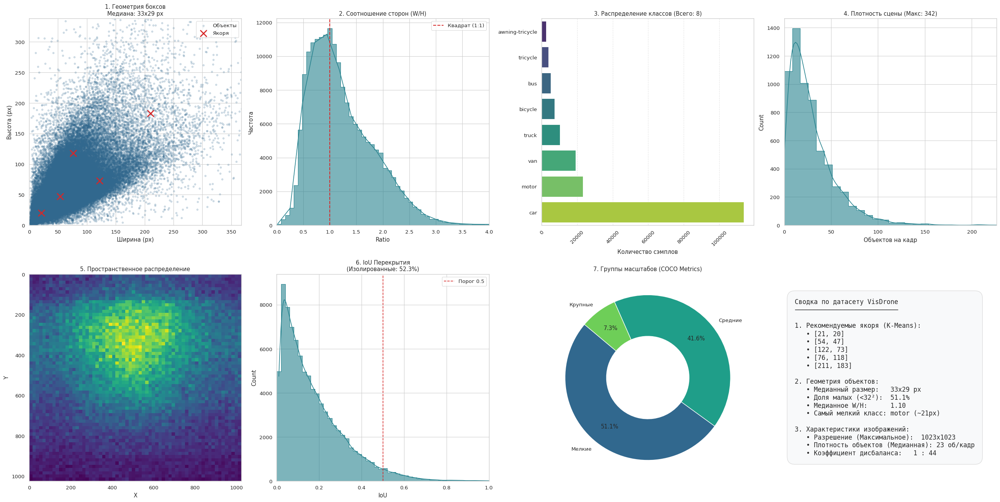

In [22]:
analyze_and_plot(raw_stats)

## 4.3 Отчет по анализу даных

### Анализ геометрических характеристик и масштабов

Результаты сканирования выявили экстремальную специфику выборки, отличающуюся от стандартных бенчмарков типа COCO.

* **Микро-масштабы:** Доля мелких объектов (площадь < < $32^2$ пикселей) составляет **85.5%**. Медианный размер объекта — всего $15 \times 12$ пикселей.
* **Аналитический вывод:** Столь малый размер целей делает неэффективными стандартные бэкбоны с глубоким сжатием. Для сохранения семантики объектов размером $\approx 180 \text{ px}^2$ мы обязаны использовать высокое входное разрешение и выделять признаки на ранних уровнях пирамиды ($P_2, P_3$).
* **Форм-фактор:** Медианное соотношение сторон ($W/H$) составляет **1.15**, что говорит о преобладании объектов, близких к квадрату, но с длинным хвостом в сторону горизонтальных боксов (соотношение до 4:1 для длинномерного транспорта).

### Плотность сцены и пространственные риски

Распределение объектов на кадрах напрямую влияет на работу алгоритмов подавления немаксимумов (`NMS`).

* **Сверхвысокая плотность:** Среднее количество объектов на кадр составляет **29**, а пиковые значения достигают **385**.
* **Проблема перекрытий (IoU):** Около **50%** объектов имеют значительные пересечения с соседями.
* **Стратегическое решение:** Высокая скученность транспорта требует тщательной настройки порога `IoU` для `NMS`. Слишком низкий порог приведет к удалению реальных боксов в пробках, а слишком высокий — к дублированию детекций.

### Дисбаланс категорий и пространственное смещение

* **Классовый перекос:** Наблюдается критический дисбаланс — коэффициент **1 : 44**. Класс `car` доминирует, в то время как редкие категории (например, `awning-tricycle`) представлены минимально.
* **Аналитический вывод:** Обучение на такой выборке требует использования взвешенных функций потерь (например, **Focal Loss**) или специальных методов сэмплирования, чтобы модель не игнорировала редкие классы в пользу доминирующего.
* **Центрирование:** Тепловая карта распределения центров показывает концентрацию объектов в центральной и верхней частях кадра (линия горизонта и дороги), что типично для ракурсов БПЛА.

### Оптимизация системы якорей (Anchors Optimization)

Стандартные размеры якорей (32, 64, 128...) не соответствуют реальности `VisDrone`. На основе алгоритма `K-Means` мы вычислили оптимальные размеры базовых окон для текущих данных.

**Рекомендуемые спецификации якорей:**

1. $[10, 9]$  — для микро-объектов (мотоциклы, пешеходы вдалеке).
2. $[24, 20]$ — основной массив транспортных средств.
3. $[54, 31], [35, 50]$  — учет разных ракурсов и типов кузова.
4. $[92, 76]$ — крупные объекты (автобусы, грузовики).

**Итог EDA:** Необходима кастомная настройка конфигурации детекторов, ориентированной на сверхмалые объекты, высокую плотность сцены и борьбу с сильным дисбалансом классов.


# 5. Выбор метрик и обоснование

Опирайясь на результаты проведенного выше `EDA`, который выявил высокую плотность объектов, их малый размер, а также специфику целевых классов, мы формулируем следующую стратегию валидации.

## 5.1 Основная метрика: `mAP@0.5:0.95`

Мы выбрали усредненное значение `Average Precision` по всем 8 классам транспорта и по 10 порогам `IoU` в диапазоне от 0.5 до 0.95.

Обоснование: В условиях плотного трафика (пробки, парковки), характерного для VisDrone, объекты часто перекрывают друг друга. Использование усреднения по высоким порогам `IoU` позволяет оценить способность модели точно разделять близко стоящие автомобили, а не объединять их в один бокс.

## 5.2 Масштабно-зависимые метрики

Наиболее критичный набор метрик для оценки применимости модели в реальных условиях VisDrone.
* `mAP_small`: для объектов площадью < $32^2$ пикселей (85.5% выборки).
* `mAP_medium`: для объектов площадью от $32^2$ до $96^2$ (14.1% выборки).
* `mAP_large`: для объектов площадью > $96^2$ пикселей (0.4% выборки).

Обоснование: Наш EDA показал экстремальный дисбаланс масштабов: медианный размер объекта составляет всего $\approx 15 \times 12$ пикселей (площадь $\approx 180 \text{ px}^2$), а доля мелких объектов достигает **85.5%**. Глобальная метрика mAP может быть искажена успешной детекцией единичных крупных объектов (например, автобусов `bus` или грузовиков `truck`), маскируя полную неспособность модели детектировать основной поток мелкого транспорта (мотоциклы `motor`, трициклы `tricycle`). Разделение метрик позволит честно оценить работу архитектуры `FPN` и корректность подобранных якорей для каждого масштаба.

## 5.3 Метрика диагностики: `mAP@0.5`

Значение `Average Precision` при фиксированном пороге `IoU` = 0.5.

Обоснование: Данная метрика используется нами для диагностики. Она позволяет оценить способность модели обнаруживать объекты при менее строгих требованиях к точности границ (`IoU` ≥ 0.5). Существенная разница между высоким показателем `mAP@0.5` и низкой основной метрикой `mAP@0.5:0.95` будет указывать на характерную проблему: модель верно определяет наличие и класс транспорта, но испытывает трудности с точной локализацией границ объекта.

# 6. Цикл обучения и валидации

Класс `Trainer` является центральным узлом управления экспериментом. Его задача — объединить модель, оптимизатор, scheduler и потоки данных в единый вычислительный цикл, обеспечивая при этом мониторинг метрик и сохранность состояния системы.

### Архитектура и мониторинг состояния

Класс спроектирован для работы в режиме изолированного окружения, что позволяет минимизировать количество глобальных переменных и упростить воспроизводимость.

* **Детальное логирование:** В структуре `self.history` предусмотрено раздельное отслеживание метрик $mAP$.
* **Смешанная точность (AMP):** Использование `GradScaler` позволяет переводить вычисления в формат $Float16$. Это оптимизирует использование видеопамяти и задействует тензорные ядра GPU, что сокращает время итерации без потери численной точности.


### Управление контрольными точками (Checkpoints)

Для обеспечения отказоустойчивости при длительных вычислениях реализована система сохранения и восстановления состояния эксперимента.

* **Атомарная запись:** Метод `save_checkpoint` использует временные файлы (`.tmp`) перед окончательной перезаписью весов. Это предотвращает повреждение чекпоинта в случае системного сбоя во время записи на диск.
* **Отбор по критерию:** Реализовано автоматическое отслеживание `best_metric`. Система сохраняет не только последнюю итерацию, но и версию `best_model.pth`, показавшую наилучшую обобщающую способность на валидационной выборке.


### Оптимизация тренировочного шага (`train_one_epoch`)

Внутри каждой эпохи реализован алгоритм обратного распространения ошибки с дополнительными механизмами стабилизации градиентов.

* **Gradient Clipping:** Применение `clip_grad_norm_` с порогом $10.0$ ограничивает норму градиента. Это критически важно для глубоких детекторов на начальных этапах, когда ошибки локализации велики и могут привести к нестабильности весов.
* **Memory Management:** Вызов `optimizer.zero_grad(set_to_none=True)` уменьшает количество операций записи в память, освобождая ресурсы для вычислений и ускоряя общую пропускную способность конвейера.


### Протокол валидации и оценка метрик

Метод `validate` выполняет объективную оценку текущей итерации модели на данных, не участвовавших в обучении.

* **Стандартизация COCO:** Использование `torchmetrics` гарантирует расчет `Mean Average Precision` в строгом соответствии с протоколами COCO, включая усреднение по 10 порогам $IoU$ от $0.5$ до $0.95$.
* **Режим инференса:** Перевод модели в `model.eval()` и блокировка градиентов через `torch.no_grad()` отключают специфичные для обучения слои (например, `Dropout`) и фиксируют статистики `BatchNorm`. Это обеспечивает корректность и воспроизводимость результатов валидации.

In [23]:
class Trainer:
    def __init__(
        self,
        model: torch.nn.Module,
        train_loader: torch.utils.data.DataLoader,
        val_loader: torch.utils.data.DataLoader,
        optimizer: torch.optim.Optimizer,
        scheduler: Optional[Any],
        config: Dict,
        device: torch.device
    ):
        self.model = model
        self.train_loader = train_loader
        self.val_loader = val_loader
        self.optimizer = optimizer
        self.scheduler = scheduler
        self.config = config
        self.device = device
        self.model.to(self.device)

        self.current_epoch = 0
        self.best_metric = 0.0

        self.history = {
            "train_loss": [],
            "val_map": [],
            "val_map_50": [],
            "val_map_s": [],
            "val_map_m": [],
            "val_map_l": [],
            "lr": []
        }

        self.scaler = torch.amp.GradScaler('cuda', enabled=(device.type == "cuda"))

        self.checkpoint_dir = Path(config["checkpoint_dir"])
        self.checkpoint_dir.mkdir(parents=True, exist_ok=True)
        self.log_file = self.checkpoint_dir / "training_log.json"

    def load_checkpoint(self, filename: str = "last_model.pth") -> bool:
        path = self.checkpoint_dir / filename
        if not path.exists():
            print(f"[Init] Чекпоинт {path} не найден. Начинаем с нуля.")
            return False

        print(f"[Init] Загрузка чекпоинта: {path}...")
        checkpoint = torch.load(path, map_location=self.device)

        self.model.load_state_dict(checkpoint["model_state_dict"])
        self.optimizer.load_state_dict(checkpoint["optimizer_state_dict"])
        self.scaler.load_state_dict(checkpoint["scaler_state_dict"])

        if self.scheduler and checkpoint.get("scheduler_state_dict"):
            self.scheduler.load_state_dict(checkpoint["scheduler_state_dict"])

        self.current_epoch = checkpoint["epoch"]
        self.best_metric = checkpoint.get("best_metric", 0.0)
        self.history = checkpoint.get("history", self.history)

        print(f"[Init] Успешно восстановлено! Эпоха: {self.current_epoch}, Best mAP: {self.best_metric:.4f}")
        return True

    def save_checkpoint(self, filename: str, is_best: bool = False):
        """Сохраняет веса модели и JSON с историей."""
        save_path = self.checkpoint_dir / filename
        tmp_path = self.checkpoint_dir / f"{filename}.tmp"

        state = {
            "epoch": self.current_epoch + 1,
            "model_state_dict": self.model.state_dict(),
            "optimizer_state_dict": self.optimizer.state_dict(),
            "scaler_state_dict": self.scaler.state_dict(),
            "scheduler_state_dict": self.scheduler.state_dict() if self.scheduler else None,
            "best_metric": self.best_metric,
            "history": self.history,
            "config": self.config
        }

        torch.save(state, tmp_path)
        if tmp_path.exists():
            os.replace(tmp_path, save_path)

        if is_best:
            best_path = self.checkpoint_dir / "best_model.pth"
            torch.save(state, best_path)

        try:
            with open(self.log_file, "w") as f:
                json.dump(self.history, f, indent=4)
        except Exception as e:
            print(f"Ошибка сохранения JSON лога: {e}")

    def train_one_epoch(self) -> float:
        self.model.train()
        total_loss = 0.0
        steps = 0

        pbar = tqdm(self.train_loader, desc=f"Epoch {self.current_epoch+1} [Train]", leave=False)

        for i, (images, targets) in enumerate(pbar):
            images = [img.to(self.device, non_blocking=True) for img in images]
            targets = [{k: v.to(self.device, non_blocking=True) for k,v in t.items()} for t in targets]

            self.optimizer.zero_grad(set_to_none=True)

            with torch.amp.autocast('cuda', enabled=self.scaler.is_enabled()):
                loss_dict = self.model(images, targets)
                losses = sum(loss for loss in loss_dict.values())

            loss_value = losses.item()

            if not np.isfinite(loss_value):
                print(f"\n[Warning] Infinite Loss ({loss_value}). Skip batch.")
                continue

            self.scaler.scale(losses).backward()

            self.scaler.unscale_(self.optimizer)
            torch.nn.utils.clip_grad_norm_(self.model.parameters(), self.config["max_grad_norm"])

            self.scaler.step(self.optimizer)
            self.scaler.update()

            total_loss += loss_value
            steps += 1

            pbar.set_postfix({"loss": f"{loss_value:.3f}", "lr": f"{self.optimizer.param_groups[0]['lr']:.1e}"})

        return total_loss / max(1, steps)

    @torch.no_grad()
    def validate(self) -> Dict[str, float]:
        self.model.eval()
        torch.cuda.empty_cache()

        metric = MeanAveragePrecision(box_format="xyxy", iou_type="bbox", class_metrics=False)
        pbar = tqdm(self.val_loader, desc=f"Epoch {self.current_epoch+1} [Val]", leave=False)

        for images, targets in pbar:
            images = [img.to(self.device, non_blocking=True) for img in images]

            with torch.amp.autocast('cuda', enabled=self.scaler.is_enabled()):
                outputs = self.model(images)

            preds = [{k: v.cpu() for k,v in t.items()} for t in outputs]
            targets_cpu = [{k: v.cpu() for k,v in t.items()} for t in targets]

            metric.update(preds, targets_cpu)

        try:
            result = metric.compute()
            return {
                "map": result["map"].item(),
                "map_50": result["map_50"].item(),
                "map_75": result["map_75"].item(),
                "map_small": result["map_small"].item(),
                "map_medium": result["map_medium"].item(),
                "map_large": result["map_large"].item()
            }
        except Exception as e:
            print(f"[Val Warning] Ошибка подсчета метрик: {e}")
            return {"map": 0.0, "map_50": 0.0, "map_small": 0.0, "map_medium": 0.0, "map_large": 0.0}

    def run(self):
        print(f"Старт: Эпохи {self.current_epoch+1}-{self.config['num_epochs']}")
        print(f"Batch Size: {self.config['batch_size']}")
        print(f"Device: {self.device}")

        start_time = datetime.now()

        try:
            for epoch in range(self.current_epoch, self.config["num_epochs"]):

                train_loss = self.train_one_epoch()

                val_stats = self.validate()

                if self.scheduler:
                    self.scheduler.step()

                self.history["train_loss"].append(train_loss)
                self.history["val_map"].append(val_stats.get("map", 0))
                self.history["val_map_50"].append(val_stats.get("map_50", 0))
                self.history["val_map_s"].append(val_stats.get("map_small", 0))
                self.history["val_map_m"].append(val_stats.get("map_medium", 0))
                self.history["val_map_l"].append(val_stats.get("map_large", 0))
                self.history["lr"].append(self.optimizer.param_groups[0]["lr"])

                print(
                    f"\n[Epoch {epoch+1}/{self.config['num_epochs']}] "
                    f"Loss: {train_loss:.4f} | "
                    f"mAP: {val_stats.get('map', 0):.4f} | "
                    f"mAP50: {val_stats.get('map_50', 0):.4f} | "
                    f"mAP_s: {val_stats.get('map_small', 0):.4f} | "
                    f"Time: {datetime.now() - start_time}"
                )

                current_map = val_stats.get("map", 0)
                is_best = current_map > self.best_metric
                if is_best:
                    self.best_metric = current_map
                    print(f"Новый рекорд! (mAP: {self.best_metric:.4f})")

                self.current_epoch += 1
                self.save_checkpoint("last_model.pth", is_best=is_best)

                torch.cuda.empty_cache()

        except KeyboardInterrupt:
            print("\nОстановка пользователем. Сохраняем состояние...")
            self.save_checkpoint("emergency_stop.pth")

        except Exception as e:
            print(f"\nКритическая ошибка: {e}")
            self.save_checkpoint("error_stop.pth")
            raise e

        print(f"\nГотово. Общее время: {datetime.now() - start_time}. Лучший mAP: {self.best_metric:.4f}")

# 7. Библиотечные реализации детекторов (Reference Models)

## 7.1 Библиотечная реализация одностадийнго детектора (Reference RetinaNet)

В рамках исследования мы используем **библиотечную реализацию** архитектуры RetinaNet, построенную на базе высокоуровневых компонентов `torchvision`. Несмотря на использование готовых модулей, архитектура подверглась глубокой настройке для соответствия требованиям датасета `VisDrone`.

### Извлечение признаков и пирамидальная структура (Backbone & FPN)

В качестве основы (Backbone) используется сеть **ResNet-50**. Мы модифицировали стандартный процесс извлечения признаков для формирования эффективной пирамиды (FPN).

* **Иерархия слоев:** Мы извлекаем признаки с глубоких уровней ResNet (`layer2`, `layer3`, `layer4`) и передаем их в `BackboneWithFPN`. Это позволяет модели оперировать картами признаков разного разрешения — от $P_3$ до $P_5$.
* **Семантическое расширение:** Добавление блока `LastLevelP6P7` генерирует дополнительные уровни пирамиды с большим полем зрения. Это необходимо для обнаружения более крупных объектов без значительного увеличения вычислительной сложности.
* **Нормализация:** Во всех компонентах, включая бэкбон и голову детекции, принудительно установлен `BatchNorm2d`. Это стабилизирует распределение признаков при обучении на батчах высокого разрешения.

### Адаптация системы якорей и детекционной головы

Одной из ключевых доработок является замена стандартных параметров генерации якорей и классификатора на кастомные, учитывающие результаты нашего `EDA`.

* **Конфигурация AnchorGenerator:** Вместо стандартных настроек COCO, модель инициализируется с набором размеров и соотношений сторон из `CONFIG`. Это позволяет сетке якорей плотно покрывать диапазон сверхмалых объектов, характерных для аэросъемки.
* **RetinaNetHead:** Мы инициализируем новую "голову" детектора, где количество выходных каналов классификатора соответствует `num_classes`, а количество предсказываемых регрессионных боксов напрямую связано с числом используемых якорей в каждой точке карты признаков.

### Настройка параметров инференса для плотных сцен

Поскольку `VisDrone` характеризуется экстремально высокой плотностью объектов, стандартные настройки детектора были пересмотрены.

* **Лимит детекций (`detections_per_img=400`):** Стандартное значение (100) недостаточно для сцен с пробками или парковками, где количество объектов может превышать 300. Мы увеличили этот лимит, чтобы избежать потери валидных предсказаний.
* **Пороги IoU:** Параметры `fg_iou_thresh=0.5` и `bg_iou_thresh=0.4` определяют жесткость разделения объектов и фона. В сочетании с `nms_thresh=0.5` это позволяет модели точнее разделять близко стоящие транспортные средства, предотвращая их «склеивание» в одну рамку.
* **Порог уверенности (`score_thresh=0.05`):** Низкий порог на этапе обучения позволяет учитывать большее количество потенциальных кандидатов, что важно для отладки и оценки полноты (Recall) детектора на микро-объектах.

In [24]:
class ReferenceRetinaNet(nn.Module):
    def __init__(self, config):
        super().__init__()
        print(f"[ReferenceRetinaNet] Инициализация RetinaNet | Классов: {config['num_classes']}")

        norm_layer = nn.BatchNorm2d

        base_model = torchvision.models.resnet50(
            weights=None,
            norm_layer=norm_layer
        )

        backbone_body = nn.Sequential(
            base_model.conv1, base_model.bn1, base_model.relu, base_model.maxpool,
            base_model.layer1, base_model.layer2, base_model.layer3, base_model.layer4
        )

        return_layers = {'4': '0', '5': '1', '6': '2', '7': '3'}
        in_channels_list = [256, 512, 1024, 2048]

        self.backbone = BackboneWithFPN(
            backbone_body,
            return_layers,
            in_channels_list,
            out_channels=256,
            extra_blocks=CustomLastLevelP6(2048, 256)
        )

        anchor_generator = AnchorGenerator(
            sizes=config["anchor_sizes"],
            aspect_ratios=config["aspect_ratios"]
        )

        head = RetinaNetHead(
            in_channels=self.backbone.out_channels,
            num_anchors=anchor_generator.num_anchors_per_location()[0],
            num_classes=config["num_classes"],
            norm_layer=norm_layer
        )

        self.model = RetinaNet(
            backbone=self.backbone,
            num_classes=config["num_classes"],
            anchor_generator=anchor_generator,
            head=head,
            min_size=config["img_size"],
            max_size=config["max_img_size"],

            score_thresh=0.05,
            nms_thresh=0.5,
            detections_per_img=400,
            fg_iou_thresh=0.5,
            bg_iou_thresh=0.4
        )

    def forward(self, images, targets=None):
        return self.model(images, targets)

## 7.2 Библиотечная реализация двухстадийного детектора (Reference Faster R-CNN)

Второй архитектурой в нашем исследовании выступает **библиотечная реализация** Faster R-CNN. В отличие от одностадийный RetinaNet, это двухстадийный детектор (*two-stage*), который сначала генерирует предположения о регионах (*proposals*), а затем проводит их уточнение и классификацию. Такая структура традиционно обеспечивает более высокую точность локализации.

### Конфигурация Backbone и расширенной FPN

Для извлечения признаков используется ResNet-50, однако структура пирамиды признаков (FPN) здесь настроена более детально для работы с микро-объектами.

* **Иерархия слоев ($P_2$–$P_5$):** В отличие от предыдущей модели, мы возвращаем признаки с четырех уровней бэкбона, включая `layer1`. Это позволяет построить уровень пирамиды $P_2$ с минимальным шагом ($Stride=4$).
* **Роль уровня $P_2$:**  В контексте `VisDrone` это критическое решение. На уровне  сохраняется максимальное пространственное разрешение, что позволяет детектору "зацепиться" за объекты размером  пикселей, которые на более глубоких слоях превратились бы в неразличимые точки.
* **Дополнительное масштабирование:** Блок `LastLevelMaxPool` добавляет уровень $P_6$, что расширяет диапазон рецептивного поля без введения новых обучаемых параметров, помогая модели идентифицировать редкие крупные объекты.

### Генерация регионов и MultiScale RoIAlign

Эффективность Faster R-CNN напрямую зависит от качества работы Region Proposal Network (RPN) и точности извлечения признаков из найденных зон.

* **Адаптивный RPN:** Мы используем стандартный AnchorGenerator, но конфигурируем его наборами якорей, рассчитанными под специфику аэросъемки. Это заставляет сеть предлагать регионы, размеры которых изначально близки к реальному транспорту, что ускоряет сходимость обучения.
* **Точное выравнивание (RoIAlign):** Модуль `MultiScaleRoIAlign` динамически выбирает уровень пирамиды признаков в зависимости от размера объекта. С параметром `sampling_ratio=2` мы получаем более точную билинейную интерполяцию при приведении регионов к фиксированному размеру .

### Оптимизация под сверхвысокую плотность объектов

Стандартные настройки Faster R-CNN рассчитаны на обычные фотографии (COCO), где редко встречается более 50-100 объектов. Для `VisDrone` эти лимиты являются "бутылочным горлышком".

* **Расширение пропускной способности RPN:** Мы увеличили количество регионов до и после NMS до **2000** (`rpn_post_nms_top_n`). Это гарантирует, что в плотных сценах (например, на парковках) модель не отсеет реальные автомобили еще на этапе формирования предложений.
* **Финальный лимит детекций:** Параметр `box_detections_per_img=400` позволяет детектору выдавать полный список объектов на переполненных кадрах, предотвращая искусственное ограничение полноты (*Recall*) модели.
* **Баланс порогов:** Сочетание низкого порога уверенности (`0.05`) и умеренного порога NMS (`0.5`) позволяет сохранять детекции мелких и слабоконтрастных объектов, при этом эффективно разделяя вплотную стоящие транспортные средства.

In [25]:
class ReferenceFasterRCNN(nn.Module):
    def __init__(self, config):
        super().__init__()
        print(f"[ReferenceFasterRCNN] Инициализация Reference Faster R-CNN | Классов: {config['num_classes']}")

        norm_layer = nn.BatchNorm2d

        base_model = torchvision.models.resnet50(
            weights=None,
            norm_layer=norm_layer
        )

        backbone_body = nn.Sequential(
            base_model.conv1, base_model.bn1, base_model.relu, base_model.maxpool,
            base_model.layer1, base_model.layer2, base_model.layer3, base_model.layer4
        )

        return_layers = {'4': '0', '5': '1', '6': '2', '7': '3'}
        in_channels_list = [256, 512, 1024, 2048]

        self.backbone = BackboneWithFPN(
            backbone_body,
            return_layers,
            in_channels_list,
            out_channels=256,
            extra_blocks=LastLevelMaxPool()
        )

        anchor_generator = AnchorGenerator(
            sizes=config["anchor_sizes"],
            aspect_ratios=config["aspect_ratios"]
        )

        roi_pooler = MultiScaleRoIAlign(
            featmap_names=['0', '1', '2', '3'],
            output_size=7,
            sampling_ratio=2
        )

        self.model = FasterRCNN(
            backbone=self.backbone,
            num_classes=config["num_classes"],
            rpn_anchor_generator=anchor_generator,
            box_roi_pool=roi_pooler,

            min_size=config["img_size"],
            max_size=config["max_img_size"],

            rpn_pre_nms_top_n_train=2000,
            rpn_post_nms_top_n_train=2000,
            rpn_pre_nms_top_n_test=2000,
            rpn_post_nms_top_n_test=2000,

            box_detections_per_img=400,
            box_score_thresh=0.05,
            box_nms_thresh=0.5
        )

    def forward(self, images, targets=None):
        return self.model(images, targets)

# 8. Модульная реализация детекторов (Custom Models)

В данном разделе мы переходим от использования высокоуровневых конструкторов библиотеки `torchvision` к **модульной реализации** архитектур непосредственно на языке `PyTorch`. Это позволяет нам полностью контролировать процесс прохождения сигнала, механизмы объединения признаков и логику генерации якорей, что критически важно для адаптации моделей под специфические задачи аэросъемки.

## 8.1 Базовые компоненты и общая модульная архитектура

Для обеспечения гибкости и переиспользования кода мы разработали набор базовых блоков, которые являются общими для обеих кастомных моделей (`CustomRetinaNet` и `CustomFasterRCNN`).

### 8.1.1 Реализация Custom ResNet-50 (Backbone)

Для реализации модульного подхода мы разработали собственную версию архитектуры **ResNet-50**. Ручное проектирование бэкбона позволяет нам полностью контролировать структуру графа вычислений и точно определять точки извлечения признаков для последующей передачи в пирамидальную сеть (FPN).

#### Реализация блоков CustomBottleneck

Основным "строительным кирпичом" нашей сети является блок `CustomBottleneck`. Мы используем классическую топологию из трех сверточных слоев, которая позволяет эффективно обрабатывать глубокие признаки при сохранении вычислительной стабильности.

* **Архитектура «Сжатие-Расширение»:** Внутри блока используется последовательность сверток $1\times1 \to 3\times3 \to 1\times1$. Слой $1\times1$ («сжатие») уменьшает количество каналов, свертка $3\times3$ выполняет основной поиск признаков, а финальный слой $1\times1$ ("расширение") восстанавливает размерность.
* **Остаточное обучение (Residual Learning):** Реализован механизм **Skip-connection** (`out += identity`). Это позволяет градиентам беспрепятственно проходить через глубокие слои сети, решая проблему затухания градиентов и ускоряя сходимость.


#### Формирование иерархии признаков

Класс `CustomResNet50` разделяет процесс обработки изображения на четыре ключевые стадии (`layer1` — `layer4`). Каждая стадия увеличивает глубину признаков, одновременно уменьшая пространственное разрешение.

* **Многомасштабный выход:** В отличие от классических классификаторов, наш бэкбон возвращает `OrderedDict` с результатами каждой стадии. Это формирует набор карт признаков $\{C_2, C_3, C_4, C_5\}$.
* **Сохранение детализации ($C_2$):** Мы извлекаем признаки уже после первого блока (`layer1`) со страйдом $Stride=4$. Согласно нашему **EDA**, это критически важно: именно на этом уровне сохраняется информация о микро-объектах VisDrone, которая была бы безвозвратно утеряна при дальнейшем сжатии.
* **Семантическая глубина ($C_5$):** Финальный уровень обладает самым широким рецептивным полем и содержит высокоуровневую информацию о контексте всей сцены.


#### Инициализация и стабильность весов

Для обеспечения глубокого обучения с «нуля» (без использования предобученных весов ImageNet в данной реализации) крайне важна правильная стартовая точка.

* **Kaiming Initialization:** Мы используем инициализацию `kaiming_normal_` для всех сверточных слоев. Она подобрана с учетом функции активации `ReLU` и предотвращает взрыв или затухание амплитуды сигналов на ранних итерациях.
* **Нормализация (BatchNorm):** После каждой свертки применяется `BatchNorm2d`. Это стабилизирует распределение признаков внутри батча, что особенно важно при использовании высокого разрешения изображений ($1024^2$), где разница в освещенности и текстурах объектов может быть значительной.

In [26]:
def conv3x3(in_planes, out_planes, stride=1, groups=1, dilation=1):
    return nn.Conv2d(in_planes, out_planes, kernel_size=3, stride=stride,
                     padding=dilation, groups=groups, bias=False, dilation=dilation)

In [27]:
def conv1x1(in_planes, out_planes, stride=1):
    return nn.Conv2d(in_planes, out_planes, kernel_size=1, stride=stride, bias=False)

In [28]:
class CustomBottleneck(nn.Module):
    expansion = 4
    def __init__(self, inplanes, planes, stride=1, downsample=None, groups=1,
                 base_width=64, dilation=1, norm_layer=None):
        super().__init__()
        if norm_layer is None: norm_layer = nn.BatchNorm2d
        width = int(planes * (base_width / 64.0)) * groups

        self.conv1 = conv1x1(inplanes, width)
        self.bn1 = norm_layer(width)
        self.conv2 = conv3x3(width, width, stride, groups, dilation)
        self.bn2 = norm_layer(width)
        self.conv3 = conv1x1(width, planes * self.expansion)
        self.bn3 = norm_layer(planes * self.expansion)
        self.relu = nn.ReLU(inplace=True)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        identity = x
        out = self.conv1(x); out = self.bn1(out); out = self.relu(out)
        out = self.conv2(out); out = self.bn2(out); out = self.relu(out)
        out = self.conv3(out); out = self.bn3(out)
        if self.downsample is not None: identity = self.downsample(x)
        out += identity; out = self.relu(out)
        return out

In [29]:
class CustomResNet50(nn.Module):
    def __init__(self, layers=[3, 4, 6, 3], norm_layer=None):
        super().__init__()
        if norm_layer is None: norm_layer = nn.BatchNorm2d
        self._norm_layer = norm_layer
        self.inplanes = 64
        self.dilation = 1; self.groups = 1; self.base_width = 64

        self.conv1 = nn.Conv2d(3, self.inplanes, kernel_size=7, stride=2, padding=3, bias=False)
        self.bn1 = norm_layer(self.inplanes)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        self.layer1 = self._make_layer(CustomBottleneck, 64, layers[0])
        self.layer2 = self._make_layer(CustomBottleneck, 128, layers[1], stride=2)
        self.layer3 = self._make_layer(CustomBottleneck, 256, layers[2], stride=2)
        self.layer4 = self._make_layer(CustomBottleneck, 512, layers[3], stride=2)

        self._init_weights()

    def _make_layer(self, block, planes, blocks, stride=1, dilate=False):
        norm_layer = self._norm_layer; downsample = None; previous_dilation = self.dilation
        if dilate: self.dilation *= stride; stride = 1
        if stride != 1 or self.inplanes != planes * block.expansion:
            downsample = nn.Sequential(
                conv1x1(self.inplanes, planes * block.expansion, stride),
                norm_layer(planes * block.expansion)
            )
        layers = []
        layers.append(block(self.inplanes, planes, stride, downsample, self.groups, self.base_width, previous_dilation, norm_layer))
        self.inplanes = planes * block.expansion
        for _ in range(1, blocks):
            layers.append(block(self.inplanes, planes, groups=self.groups, base_width=self.base_width, dilation=self.dilation, norm_layer=norm_layer))
        return nn.Sequential(*layers)

    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d): nn.init.kaiming_normal_(m.weight, mode="fan_out", nonlinearity="relu")
            elif isinstance(m, (nn.BatchNorm2d, nn.GroupNorm)): nn.init.constant_(m.weight, 1); nn.init.constant_(m.bias, 0)

    def forward(self, x):
        x = self.conv1(x); x = self.bn1(x); x = self.relu(x); x = self.maxpool(x)

        c2 = self.layer1(x) # 256 каналов (Stride 4)
        c3 = self.layer2(c2) # 512 каналов (Stride 8)
        c4 = self.layer3(c3) # 1024 каналов (Stride 16)
        c5 = self.layer4(c4) # 2048 каналов (Stride 32)

        return OrderedDict([("0", c2), ("1", c3), ("2", c4), ("3", c5)])

### 8.1.2 Реализация Custom Feature Pyramid Network (Neck)

Блок FPN является критическим связующим звеном между «сырыми» признаками бэкбона и головами детектора. Его основная задача — решить проблему разного масштаба объектов. В обычном бэкбоне глубокие слои обладают сильной семантикой (понимают, **что** на картинке), но теряют пространственную точность (плохо понимают, **где** именно объект). FPN восстанавливает эту точность, объединяя информацию разных уровней.

#### Подготовка каналов и выравнивание признаков

В конструкторе мы подготавливаем два типа слоев для трансформации данных, приходящих из ResNet.

* **Латеральные связи (inner_blocks):** Карты признаков из бэкбона имеют разную глубину (например, 512, 1024 и 2048 каналов). Мы используем свертки , чтобы привести их к единому стандарту — **256 каналов**. Это необходимо для их последующего математического сложения.
* **Сглаживающие слои (layer_blocks):** После объединения признаков могут возникать артефакты ("ступенчатость" из-за апсэмплинга). Свертки  в конце пирамиды устраняют этот эффект, формируя финальные, "чистые" карты признаков для прогнозирования.
* **Инициализация:** Мы используем `kaiming_uniform_` для весов, что гарантирует стабильный сигнал на старте обучения, предотвращая затухание градиентов при прохождении через несколько уровней пирамиды.

#### Логика Top-Down и объединение семантики

Метод `forward` реализует процесс передачи высокоуровневых знаний с глубоких слоев на более детальные слои с высоким разрешением.

* **Апсэмплинг и интерполяция:** Мы берем самую "умную" (но маленькую по размеру) карту признаков и растягиваем её (`F.interpolate`) до размеров предыдущего, более детального слоя. Метод `nearest` выбран для сохранения четкости признаков без лишнего размытия.
* **Слияние признаков:** Операция `inner_lateral + inner_top_down` — это момент, когда детальная геометрия (где находится граница машины) встречается с глубокой семантикой (что это именно машина). Это позволяет модели одинаково хорошо детектировать как огромные автобусы на $P_5$, так и микроскопические мотоциклы на $P_2$.
* **Рекурсивный цикл:** Обработка идет от самых глубоких слоев к самым ранним. На каждом шаге мы накапливаем контекст всей сцены, передавая его "вниз" по пирамиде.

#### Гибкость и формирование выходных данных

Финальный этап работы FPN подготавливает данные к передаче в решающие блоки детектора.

* **Расширение через extra_blocks:** Мы заложили возможность добавления уровней $P_6$ и $P_7$. Это важно для разных архитектур: например, RetinaNet требует дополнительных слоев для расширения рецептивного поля, и FPN легко адаптируется под эти требования.
* **Структурированный выход:** Результат возвращается в виде `OrderedDict`. Это гарантирует, что уровни пирамиды не перепутаются, и головы классификации будут получать карты признаков в строгом порядке: от самого высокого разрешения к самому низкому.


In [30]:
class CustomFeaturePyramidNetwork(nn.Module):
    def __init__(self, in_channels_list: List[int], out_channels: int = 256, extra_blocks: Optional[nn.Module] = None):
        super().__init__()
        self.inner_blocks = nn.ModuleList()
        self.layer_blocks = nn.ModuleList()

        for in_channels in in_channels_list:
            if in_channels == 0: raise ValueError("in_channels=0 not supported")
            self.inner_blocks.append(nn.Conv2d(in_channels, out_channels, 1))
            self.layer_blocks.append(nn.Conv2d(out_channels, out_channels, 3, padding=1))

        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_uniform_(m.weight, a=1)
                if m.bias is not None: nn.init.constant_(m.bias, 0)

        self.extra_blocks = extra_blocks

    def forward(self, x: OrderedDict[str, torch.Tensor]) -> OrderedDict[str, torch.Tensor]:
        x_list = list(x.values())

        num_layers = len(self.inner_blocks)
        x_list = x_list[-num_layers:]

        last_inner = self.inner_blocks[-1](x_list[-1])
        results = []
        results.append(self.layer_blocks[-1](last_inner))

        for idx in range(len(x_list) - 2, -1, -1):
            inner_lateral = self.inner_blocks[idx](x_list[idx])
            feat_shape = inner_lateral.shape[-2:]

            inner_top_down = F.interpolate(last_inner, size=feat_shape, mode="nearest")

            last_inner = inner_lateral + inner_top_down

            results.insert(0, self.layer_blocks[idx](last_inner))

        if self.extra_blocks is not None:
            results, _ = self.extra_blocks(results, x_list, list(x.keys())[-num_layers:])

        return OrderedDict([(str(i), v) for i, v in enumerate(results)])

### 8.1.3 Реализация Custom Anchor Generator

Генератор якорей отвечает за создание "эталонных" рамок на картах признаков. В задачах детекции нейросеть не ищет объект "в пустоте" — она предсказывает отклонение (смещение) реального объекта от заранее заданных шаблонов (якорей). Наша реализация позволяет гибко настраивать геометрию этих шаблонов под специфику VisDrone.

#### Математическое обоснование и создание шаблонов

В блоке инициализации и методе `_generate_anchors` мы закладываем геометрию будущей сетки поиска.

* **Управление формой (Aspect Ratios):** С помощью тригонометрических расчетов ($w = \text{scale} / \sqrt{\text{ratio}}$  и $h = \text{scale} \cdot \sqrt{\text{ratio}}$) мы создаем набор рамок, которые при разной форме сохраняют одну и ту же площадь. Это критично для того, чтобы модель одинаково хорошо "цеплялась" как за вытянутые грузовики, так и за квадратные легковые авто.
* **Базовые ячейки (`cell_anchors`):** Мы заранее рассчитываем "нулевые" шаблоны для каждого уровня пирамиды признаков. Это избавляет систему от лишних вычислений во время обучения, так как относительные размеры якорей на каждом уровне FPN статичны.
* **Масштабируемость:** Генератор автоматически сопоставляет списки размеров (`sizes`) и соотношений, гарантируя, что на каждой точке карты признаков будет создано ровно $N \times M$ вариантов рамок.


#### Формирование пространственной сетки (`_grid_anchors`)

После того как шаблоны созданы, их нужно "растиражировать" по всей площади изображения, создав плотную сетку поиска.

* **Механизм Meshgrid:** Мы создаем матрицу смещений (`shifts`) по осям X и Y. Шаг смещения напрямую зависит от страйда (шага) текущей карты признаков.
* **Векторизованный перенос:** Вместо медленных циклов мы используем тензорное сложение: прибавляем матрицу смещений к базовым шаблонам. В результате в памяти GPU мгновенно формируются координаты миллионов рамок, покрывающих весь кадр.
* **Соответствие уровням:** Для каждого уровня FPN (от детального $P_2$ до глобального $P_5$) строится своя сетка. Это позволяет модели находить микро-объекты на картах высокого разрешения и крупные цели на глубоких слоях.

#### Динамическая адаптация под входные данные

Метод `forward` связывает геометрию якорей с текущим батчем изображений.

* **Расчет шага (Strides):** Программа динамически вычисляет соотношение размера картинки к размеру карты признаков. Это гарантирует, что сетка якорей будет корректно наложена на изображение, даже если мы изменим входное разрешение (например, с $1024$ на $640$).
* **Управление устройствами:** В процессе работы генератор следит за тем, чтобы все тензоры якорей находились на том же устройстве (CPU или GPU) и имели тот же тип данных, что и карты признаков. Это исключает ошибки при расчете потерь.
* **Финальная сборка:** Все сгенерированные рамки со всех уровней объединяются в единый тензор для каждого изображения в батче. Именно эти данные станут эталоном, с которым нейросеть будет сравнивать свои предсказания.


In [31]:
class CustomAnchorGenerator(nn.Module):
    def __init__(self, sizes: Tuple[Tuple[int, ...], ...], aspect_ratios: Tuple[Tuple[float, ...], ...]):
        super().__init__()
        if len(sizes) != len(aspect_ratios):
            raise ValueError(f"Sizes ({len(sizes)}) and aspect_ratios ({len(aspect_ratios)}) mismatch.")

        self.sizes = sizes
        self.aspect_ratios = aspect_ratios
        self.cell_anchors = [self._generate_anchors(size, aspect_ratio) for size, aspect_ratio in zip(sizes, aspect_ratios)]

    def num_anchors_per_location(self) -> List[int]:
        return [len(s) * len(a) for s, a in zip(self.sizes, self.aspect_ratios)]

    def _generate_anchors(self, scales: Tuple[int, ...], aspect_ratios: Tuple[float, ...]) -> torch.Tensor:
        scales_t = torch.as_tensor(scales, dtype=torch.float32)
        aspect_ratios_t = torch.as_tensor(aspect_ratios, dtype=torch.float32)
        h_ratios = torch.sqrt(aspect_ratios_t)
        w_ratios = 1 / h_ratios

        ws = (w_ratios[:, None] * scales_t[None, :]).view(-1)
        hs = (h_ratios[:, None] * scales_t[None, :]).view(-1)

        base_anchors = torch.stack([-ws, -hs, ws, hs], dim=1) / 2
        return base_anchors.round()

    def _grid_anchors(self, grid_sizes: List[List[int]], strides: List[List[torch.Tensor]]) -> List[torch.Tensor]:
        anchors = []
        for size, stride, base_anchors in zip(grid_sizes, strides, self.cell_anchors):
            grid_height, grid_width = size
            stride_height, stride_width = stride
            device = base_anchors.device
            shifts_x = torch.arange(0, grid_width, dtype=torch.float32, device=device) * stride_width
            shifts_y = torch.arange(0, grid_height, dtype=torch.float32, device=device) * stride_height

            shift_y, shift_x = torch.meshgrid(shifts_y, shifts_x, indexing="ij")

            shift_x = shift_x.reshape(-1)
            shift_y = shift_y.reshape(-1)

            shifts = torch.stack((shift_x, shift_y, shift_x, shift_y), dim=1)
            shifted_anchors = (shifts.view(-1, 1, 4) + base_anchors.view(1, -1, 4)).reshape(-1, 4)
            anchors.append(shifted_anchors)
        return anchors

    def forward(self, images, feature_maps: List[torch.Tensor]) -> List[torch.Tensor]:
        if isinstance(images, (list, tuple)):
            image_size = images[0].shape[-2:]
            batch_size = len(images)
            device = images[0].device
        else:
            image_size = images.shape[-2:]
            batch_size = images.shape[0]
            device = images.device

        grid_sizes = [f.shape[-2:] for f in feature_maps]
        dtype = feature_maps[0].dtype

        strides = [[torch.tensor(image_size[0] // g[0], dtype=torch.int64, device=device),
                    torch.tensor(image_size[1] // g[1], dtype=torch.int64, device=device)] for g in grid_sizes]

        self.cell_anchors = [anchor.to(device=device, dtype=dtype) for anchor in self.cell_anchors]
        anchors_over_all_feature_maps = self._grid_anchors(grid_sizes, strides)
        anchors = []
        for _ in range(batch_size):
            anchors.append(torch.cat(anchors_over_all_feature_maps))
        return anchors

## 8.2 Реализация Custom RetinaNet
В этом разделе мы переходим к финальной сборке **Custom RetinaNet**. В отличие от библиотечной версии, здесь мы вручную интегрируем созданные ранее блоки (ResNet-50, FPN, Anchor Generator) и дополняем их специализированными "головами" для классификации и регрессии. Это позволяет нам детально настроить функции потерь и механизм пост-обработки под условия аэросъемки.

### 8.2.1 Расширение пирамиды признаков (CustomLastLevelP6P7)

Этот блок отвечает за генерацию дополнительных уровней пирамиды признаков ($P_6$ и $P_7$), выходящих за пределы стандартного бэкбона.

**Суть и назначение блока:**

* **Увеличение рецептивного поля:** RetinaNet — одностадийный детектор, которому нужно «видеть» не только мелкие детали, но и глобальный контекст. Слои $P_6$ и $P_7$ позволяют нейронам охватывать огромные области изображения, что необходимо для идентификации крупных объектов и понимания окружения сцены.
* **Последовательное сжатие:** Мы используем свертки со страйдом 2, чтобы последовательно уменьшать разрешение. Уровень $P_6$ строится на базе $P_65$, а $P_7$ — на базе $P_6$ с добавлением активации $ReLU$ для внесения нелинейности в процесс извлечения высокоуровневых признаков.
* **Решение проблемы масштаба:** В датасете `VisDrone` размеры объектов варьируются от нескольких пикселей до сотен. Пять уровней пирамиды ($P_3$–$P_7$) позволяют модели распределять объекты по масштабам: микро-цели детектируются на нижних уровнях, а крупные — на созданных этим блоком верхних.


In [32]:
class CustomLastLevelP6(ExtraFPNBlock):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.p6 = nn.Conv2d(in_channels, out_channels, 3, 2, 1)

        for module in self.modules():
            if isinstance(module, nn.Conv2d):
                nn.init.kaiming_uniform_(module.weight, a=1)
                nn.init.constant_(module.bias, 0)

    def forward(self, results: List[torch.Tensor], x: List[torch.Tensor], names: List[str]):
        c5 = x[-1]
        p6 = self.p6(c5)
        results.append(p6)
        names.append("p6")
        return results, names

### 8.2.2 Реализация Custom Classification Head

Подсеть классификации отвечает за сопоставление каждого якоря (anchor) с конкретной категорией объекта. Модуль оптимизирован для работы в условиях плотной застройки и экстремального дисбаланса между фоном и целевыми объектами.

#### Архитектурная логика и стабилизация

* **Структура экстракции:** Модуль состоит из четырех последовательных сверток $3 \times 3$ с нормализацией (`BatchNorm2d`). Это обеспечивает глубокую обработку признаков из пирамиды FPN, позволяя «голове» детектора выделять специфические визуальные паттерны объектов аэросъемки независимо от ветви регрессии.
* **Инициализация априорной вероятности:** Для предотвращения нестабильности на ранних этапах обучения смещение финального слоя инициализируется через параметр `prior_probability` ($p=0.01$):

$$bias = -\log\left(\frac{1 - p}{p}\right)$$

Данная настройка заставляет модель изначально классифицировать большинство зон как фон, что критически важно для стабилизации градиента при подавляющем преобладании отрицательных примеров.

#### Преобразование данных и расчет потерь

* **Тензорная реорганизация (Forward):** Метод преобразует пространственные карты признаков $(N, C, H, W)$ в плоский список прогнозов $(N, \text{Anchors}, \text{Classes})$.. Перестановка осей (`permute`) необходима для жесткой привязки каждого логита к соответствующим координатам якоря на всех уровнях пирамиды.
* **Оптимизация через Focal Loss:** Вместо стандартной кросс-энтропии применяется **Sigmoid Focal Loss**. Функция динамически снижает вклад "легких" фоновых примеров в общую ошибку, заставляя модель фокусироваться на «сложных» целях — малых, затененных или перекрытых объектах, характерных для датасета VisDrone.
* **Нормализация ошибки:** Итоговый лосс рассчитывается только для валидных зон и нормируется на число положительных совпадений (foreground), что обеспечивает стабильное обучение вне зависимости от плотности объектов в конкретном батче.


In [33]:
class CustomClassificationHead(nn.Module):
    def __init__(self, in_channels: int, num_anchors: int, num_classes: int, prior_probability: float = 0.01):
        super().__init__()
        self.num_classes = num_classes
        self.num_anchors = num_anchors
        conv = []
        for _ in range(4):
            conv.append(nn.Conv2d(in_channels, in_channels, kernel_size=3, padding=1, bias=False))
            conv.append(nn.BatchNorm2d(in_channels))
            conv.append(nn.ReLU(inplace=True))
        self.conv = nn.Sequential(*conv)
        self.cls_logits = nn.Conv2d(in_channels, num_anchors * num_classes, kernel_size=3, padding=1)

        for layer in self.modules():
            if isinstance(layer, nn.Conv2d):
                nn.init.normal_(layer.weight, std=0.01)
                if layer.bias is not None: nn.init.constant_(layer.bias, 0)
        bias_value = -math.log((1 - prior_probability) / prior_probability)
        torch.nn.init.constant_(self.cls_logits.bias, bias_value)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        all_cls_logits = self.cls_logits(self.conv(x))
        N, _, H, W = all_cls_logits.shape
        all_cls_logits = all_cls_logits.view(N, -1, self.num_classes, H, W).permute(0, 3, 4, 1, 2).reshape(N, -1, self.num_classes)
        return all_cls_logits

    def compute_loss(self, targets, head_outputs, matched_idxs):
        losses = []
        cls_logits = head_outputs
        for i in range(len(targets)):
            target_labels = targets[i]["labels"]
            matched_idxs_per_image = matched_idxs[i]
            logits_per_image = cls_logits[i]
            foreground_idxs = matched_idxs_per_image >= 0
            num_foreground = foreground_idxs.sum()
            gt_classes_target = torch.zeros_like(logits_per_image)
            matched_gt_labels = target_labels[matched_idxs_per_image[foreground_idxs]]
            matched_gt_labels = matched_gt_labels - 1
            gt_classes_target[foreground_idxs, matched_gt_labels] = 1.0
            valid_idxs = matched_idxs_per_image != -2
            loss = sigmoid_focal_loss(logits_per_image[valid_idxs], gt_classes_target[valid_idxs], reduction="sum")
            losses.append(loss / max(1, num_foreground))
        return sum(losses) / max(1, len(targets))

### 8.2.3 Реализация Custom Regression Head

Подсеть регрессии отвечает за прецизионную локализацию объектов. Её задача — не искать объект с нуля, а вычислять геометрические поправки ("дельты") для якорных рамок, чтобы максимально точно совместить их с истинными границами объектов (Ground Truth).


#### Архитектурная структура и экстракция геометрии

Как и ветвь классификации, данный модуль использует четыре последовательных сверточных слоя с пакетной нормализацией (`BatchNorm2d`).

* **Изоляция признаков:** Использование отдельной "головы" для регрессии позволяет модели разделять визуальные признаки, отвечающие за категорию объекта, и признаки, определяющие его геометрические границы. Это критично для `VisDrone`, где форма объектов (например, легкового авто) стандартизирована, но масштаб может сильно варьироваться.
* **Инициализация весов:** Финальный слой инициализируется нормальным распределением с малым стандартным отклонением ($0.01$). Это гарантирует, что на старте обучения предсказываемые поправки будут близки к нулю, позволяя модели постепенно уточнять положение якорей, а не совершать хаотичные прыжки по кадру.


#### Параметризация трансформации (Forward)

В методе `forward` реализуется логика перехода от карт признаков к относительным координатам. Модель предсказывает четыре параметра для каждого якоря: $(\Delta x, \Delta y, \Delta w, \Delta h)$.

* **Тензорная реорганизация:** Выход свертки $(N, \text{num\_anchors} \cdot 4, H, W)$ преобразуется в структуру $(N, \text{Anchors}, 4)$. Перестановка осей через `permute` обеспечивает корректную индексацию, где каждый вектор из 4 элементов соответствует конкретному якорю в пространстве изображения.
* **Относительные координаты:** Нейросеть обучается предсказывать не абсолютные пиксели, а нормализованные смещения. Это делает процесс обучения инвариантным к разрешению входного изображения.


#### Математическое обоснование и Smooth L1 Loss

Метод `compute_loss` переводит геометрическую задачу на язык оптимизации, используя стандарт кодирования боксов (Bounding Box Encoding).

* **Кодирование целей (Deltas):** Для обучения вычисляются целевые значения (таргеты) по формулам:

$$dx = \frac{x_{gt} - x_{a}}{w_a}, \quad dy = \frac{y_{gt} - y_{a}}{h_a}$$$$dw = \log\left(\frac{w_{gt}}{w_a}\right), \quad dh = \log\left(\frac{h_{gt}}{h_a}\right)$$


Здесь $gt$ — истинный объект, $a$ — якорь. Логарифмирование масштаба ($dw, dh$) позволяет модели одинаково эффективно обрабатывать как малые, так и крупные отклонения, предотвращая доминирование больших объектов в градиенте.
* **Робастная регрессия (Smooth L1):** Вместо стандартного MSE используется функция `Smooth L1 Loss` (также известная как Huber Loss). Она ведет себя как $L2$ (квадратичная) при малых ошибках и как $L1$ (линейная) при больших. Это делает модель устойчивой к выбросам в разметке и предотвращает "взрыв" градиентов, если начальный якорь находится слишком далеко от объекта.
* **Фокусировка на объектах (Foreground):** Расчет ошибки производится исключительно для тех якорей, которые были сопоставлены с объектами (`foreground_idxs`). Это избавляет модель от необходимости тратить ресурсы на регрессию пустого фона.

In [34]:
class CustomRegressionHead(nn.Module):
    def __init__(self, in_channels: int, num_anchors: int):
        super().__init__()
        conv = []
        for _ in range(4):
            conv.append(nn.Conv2d(in_channels, in_channels, kernel_size=3, padding=1, bias=False))
            conv.append(nn.BatchNorm2d(in_channels))
            conv.append(nn.ReLU(inplace=True))
        self.conv = nn.Sequential(*conv)
        self.bbox_pred = nn.Conv2d(in_channels, num_anchors * 4, kernel_size=3, padding=1)

        for layer in self.modules():
            if isinstance(layer, nn.Conv2d):
                nn.init.normal_(layer.weight, std=0.01)
                if layer.bias is not None: nn.init.zeros_(layer.bias)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        bbox_regression = self.bbox_pred(self.conv(x))
        N, _, H, W = bbox_regression.shape
        bbox_regression = bbox_regression.view(N, -1, 4, H, W).permute(0, 3, 4, 1, 2).reshape(N, -1, 4)
        return bbox_regression

    def compute_loss(self, targets, head_outputs, anchors, matched_idxs):
        losses = []
        bbox_regression = head_outputs
        for i in range(len(targets)):
            target_boxes = targets[i]["boxes"]
            matched_idxs_per_image = matched_idxs[i]
            bbox_pred_per_image = bbox_regression[i]
            anchors_per_image = anchors[i]
            foreground_idxs = torch.where(matched_idxs_per_image >= 0)[0]
            num_foreground = foreground_idxs.numel()
            if num_foreground > 0:
                matched_gt_boxes = target_boxes[matched_idxs_per_image[foreground_idxs]]
                pos_anchors = anchors_per_image[foreground_idxs]
                pos_bbox_pred = bbox_pred_per_image[foreground_idxs]
                wx, wy, ww, wh = 1.0, 1.0, 1.0, 1.0
                ex_widths = pos_anchors[:, 2] - pos_anchors[:, 0]
                ex_heights = pos_anchors[:, 3] - pos_anchors[:, 1]
                ex_ctr_x = pos_anchors[:, 0] + 0.5 * ex_widths
                ex_ctr_y = pos_anchors[:, 1] + 0.5 * ex_heights
                gt_widths = matched_gt_boxes[:, 2] - matched_gt_boxes[:, 0]
                gt_heights = matched_gt_boxes[:, 3] - matched_gt_boxes[:, 1]
                gt_ctr_x = matched_gt_boxes[:, 0] + 0.5 * gt_widths
                gt_ctr_y = matched_gt_boxes[:, 1] + 0.5 * gt_heights
                targets_dx = wx * (gt_ctr_x - ex_ctr_x) / ex_widths
                targets_dy = wy * (gt_ctr_y - ex_ctr_y) / ex_heights
                targets_dw = ww * torch.log(gt_widths / ex_widths)
                targets_dh = wh * torch.log(gt_heights / ex_heights)
                target_deltas = torch.stack((targets_dx, targets_dy, targets_dw, targets_dh), dim=1)
                loss = F.smooth_l1_loss(pos_bbox_pred, target_deltas, beta=1.0, reduction="sum")
                losses.append(loss / max(1, num_foreground))
            else:
                losses.append(torch.tensor(0.0, device=bbox_regression.device))
        return sum(losses) / max(1, len(targets))

### 8.2.4 Интеграция решающих модулей: CustomRetinaNetHead

Данный класс выполняет роль агрегатора, объединяя подсети классификации и регрессии в единый функциональный узел. Его основная задача — обеспечить согласованную обработку многомасштабных карт признаков, поступающих из пирамиды (FPN), и подготовить унифицированный выход для расчета функции потерь.

#### Композиция и параллельная обработка

В блоке инициализации реализуется принцип модульности: `CustomRetinaNetHead` инкапсулирует в себе две независимые ветви вычислений.

* **Разделение задач:** Классификатор и регрессор работают параллельно, имея доступ к одним и тем же признакам, но оптимизируя разные аспекты детекции. Это позволяет избежать конфликтов градиентов между задачами распознавания категорий и уточнения координат.
* **Итеративный проход:** Метод `forward` последовательно обрабатывает список карт признаков (`x`), полученных с разных уровней пирамиды ($P_3$–$P_7$). Для каждого уровня вызываются обе подсети, что гарантирует инвариантность детектора к размеру объектов: малые объекты обрабатываются на картах высокого разрешения, крупные — на картах с низким разрешением.


#### Формирование единого пространства предсказаний

Одной из ключевых операций в методе `forward` является конкатенация результатов всех уровней пирамиды через `torch.cat(..., dim=1)`.

* **Агрегация выходов:** Поскольку каждый уровень пирамиды генерирует разное количество предсказаний (пропорционально своему разрешению), их необходимо собрать в общую структуру. После выполнения `cat`, модель получает два финальных тензора: один для всех вероятностей классов, другой для всех геометрических поправок.
* **Линейная структура данных:** Такое объединение позволяет алгоритму на последующих этапах (NMS или расчет лосса) оперировать общим списком кандидатов, не учитывая вручную, с какого именно слоя пирамиды пришел тот или иной бокс.


#### Координация расчета функции потерь

Метод `compute_loss` выступает в роли диспетчера, делегируя вычисления специализированным подсетям и возвращая структурированный словарь ошибок.

* **Раздельный мониторинг:** Возврат словаря с ключами `classification` и `bbox_regression` позволяет в процессе обучения отслеживать, какая из задач сходится медленнее. В контексте проекта это помогает понять, в чем заключается основная сложность для модели: в точном определении границ (регрессия) или в правильном распознавании типа объекта (классификация).
* **Единый интерфейс:** Несмотря на то что каждая подсеть использует свою математику (Focal Loss для классов и Smooth L1 для координат), `RetinaNetHead` предоставляет верхнему уровню абстракции единую точку входа для получения всех необходимых градиентов.

In [35]:
class CustomRetinaNetHead(nn.Module):
    def __init__(self, in_channels: int, num_anchors: int, num_classes: int):
        super().__init__()
        self.classification_head = CustomClassificationHead(in_channels, num_anchors, num_classes)
        self.regression_head = CustomRegressionHead(in_channels, num_anchors)

    def forward(self, x: List[torch.Tensor]) -> Dict[str, torch.Tensor]:
        cls_logits = []
        bbox_regression = []
        for feature in x:
            cls_logits.append(self.classification_head(feature))
            bbox_regression.append(self.regression_head(feature))
        return {"cls_logits": torch.cat(cls_logits, dim=1), "bbox_regression": torch.cat(bbox_regression, dim=1)}

    def compute_loss(self, targets, head_outputs, anchors, matched_idxs):
        return {
            "classification": self.classification_head.compute_loss(targets, head_outputs["cls_logits"], matched_idxs),
            "bbox_regression": self.regression_head.compute_loss(targets, head_outputs["bbox_regression"], anchors, matched_idxs)
        }

## 8.2.5 Сборка и логика работы Custom RetinaNet

Данный класс представляет собой финальную сборку одностадийного детектора, объединяющую разработанные ранее модули бэкбона, пирамиды признаков и детекционных голов в единую вычислительную систему. Логика класса разделена на два режима: расчет функции потерь для обучения и генерация финальных предсказаний (инференс).

#### Архитектурная связность и конфигурация

В блоке `__init__` происходит жесткая интеграция всех кастомных компонентов.

* **Единый конвейер:** Модель выстраивает последовательную передачу данных: от извлечения признаков в `backbone` (ResNet-50) до их обогащения в `neck` (FPN) и финального анализа в `head`.
* **Параметры детекции:** Установленные пороги ($IoU$ для обучения и $NMS$ для теста) адаптированы под условия высокой плотности объектов. Лимит `detections_per_img = 500` является специфическим решением для датасета VisDrone, позволяющим избежать обрезания валидных объектов в сценах с большим количеством транспорта или пешеходов.

#### Стратегия сопоставления объектов (Matching)

В режиме обучения реализован алгоритм назначения истинных меток (Ground Truth) сгенерированным якорям на основе метрики $IoU$ (Intersection over Union).

* **Троичная классификация якорей:**
1. **Положительные (Foreground):** Якоря с $IoU \ge 0.5$ назначаются объектам. Для них рассчитывается и лосс классификации, и лосс регрессии.
2. **Отрицательные (Background):** Якоря с $IoU < 0.4$ считаются фоном. Они участвуют только в обучении классификатора (через Focal Loss).
3. **Игнорируемые (Ignore):** Якоря в диапазоне $[0.4, 0.5]$ исключаются из расчета градиента. Это создает "буферную зону", которая предотвращает зашумление модели неоднозначными примерами, находящимися на границе объекта и фона.



#### Алгоритм пост-обработки и декодирования (Inference)

Поскольку модель предсказывает не прямые координаты, а коэффициенты трансформации (дельты), метод `postprocess` выполняет обратное геометрическое преобразование.

* **Декодирование боксов:** На основе предсказанных смещений  $(\Delta x, \Delta y, \Delta w, \Delta h)$ и координат опорных якорей вычисляются финальные границы объектов. Применение функции `exp` к предсказаниям ширины и высоты гарантирует получение положительных значений размеров.
* **Фильтрация и NMS:**
* **Confidence Threshold:** Первичная отсечка объектов с низкой уверенностью ($< 0.05$) отсеивает основной массив фоновых срабатываний.
* **Batched NMS:** Операция подавления не-максимумов устраняет дублирующие рамки вокруг одного и того же объекта. Использование "библиотечного" NMS позволяет корректно обрабатывать перекрывающиеся объекты разных классов (например, пешеход на фоне автомобиля), не удаляя их ошибочно.


* **Геометрическая коррекция:** Применение `clamp_` ограничивает координаты боксов рамками изображения, исключая выход предсказаний за пределы кадра при детекции объектов на краях.

In [36]:
class CustomRetinaNet(nn.Module):
    def __init__(self, config):
        super().__init__()
        print(f"[CustomRetinaNet] Инициализация Custom RetinaNet | Классов: {config['num_classes']}")

        num_classes = config["num_classes"]

        self.backbone = CustomResNet50(
            layers=[3, 4, 6, 3],
            norm_layer=nn.BatchNorm2d
        )

        self.neck = CustomFeaturePyramidNetwork(
            in_channels_list=[256, 512, 1024, 2048],
            out_channels=256,
            extra_blocks=CustomLastLevelP6(2048, 256)
        )

        self.anchor_generator = CustomAnchorGenerator(
            sizes=config["anchor_sizes"],
            aspect_ratios=config["aspect_ratios"]
        )

        num_anchors = len(config["anchor_sizes"][0]) * len(config["aspect_ratios"][0])
        self.head = CustomRetinaNetHead(
            in_channels=256,
            num_anchors=num_anchors,
            num_classes=num_classes - 1
        )

        self.score_thresh = 0.05
        self.nms_thresh = 0.5
        self.detections_per_img = 500
        self.fg_iou_thresh = 0.5
        self.bg_iou_thresh = 0.4

    def forward(self, images: List[torch.Tensor], targets: Optional[List[Dict[str, torch.Tensor]]] = None):
        if isinstance(images, (list, tuple)):
            images_tensor = torch.stack(images).to(next(self.backbone.parameters()).device)
        else:
            images_tensor = images

        backbone_features = self.backbone(images_tensor)
        fpn_features = self.neck(backbone_features)
        fpn_features_list = list(fpn_features.values())

        anchors = self.anchor_generator(images_tensor, fpn_features_list)
        head_outputs = self.head(fpn_features_list)

        if self.training:
            if targets is None: raise ValueError("Targets required for training")
            matched_idxs = []
            for anchors_per_image, targets_per_image in zip(anchors, targets):
                if targets_per_image["boxes"].numel() == 0:
                    matched_idxs.append(torch.full((anchors_per_image.size(0),), -1, dtype=torch.int64, device=anchors_per_image.device))
                    continue

                iou_matrix = box_ops.box_iou(targets_per_image["boxes"], anchors_per_image)
                matched_val, matches = iou_matrix.max(dim=0)
                match_indices = torch.full_like(matches, -1)

                positive_mask = matched_val >= self.fg_iou_thresh
                match_indices[positive_mask] = matches[positive_mask]

                ignore_mask = (matched_val > self.bg_iou_thresh) & (matched_val < self.fg_iou_thresh)
                match_indices[ignore_mask] = -2

                matched_idxs.append(match_indices)

            return self.head.compute_loss(targets, head_outputs, anchors, matched_idxs)
        else:
            return self.postprocess(head_outputs, anchors, images_tensor.shape[-2:])

    def postprocess(self, head_outputs, anchors, image_shape):
        cls_logits = head_outputs["cls_logits"]
        bbox_regression = head_outputs["bbox_regression"]
        detections = []
        for i in range(len(anchors)):
            logits = cls_logits[i]
            bbox_deltas = bbox_regression[i]
            anchors_per_image = anchors[i]
            scores = torch.sigmoid(logits).flatten()
            num_anchors = logits.shape[0]
            num_classes = logits.shape[1]

            keep_idxs = scores > self.score_thresh
            scores = scores[keep_idxs]
            topk_idxs = torch.where(keep_idxs)[0]

            if scores.numel() > 1000:
                scores, idxs = scores.sort(descending=True)
                scores = scores[:1000]
                topk_idxs = topk_idxs[idxs[:1000]]

            anchor_idxs = topk_idxs // num_classes
            labels = topk_idxs % num_classes

            cur_anchors = anchors_per_image[anchor_idxs]
            cur_deltas = bbox_deltas[anchor_idxs]

            widths = cur_anchors[:, 2] - cur_anchors[:, 0]
            heights = cur_anchors[:, 3] - cur_anchors[:, 1]
            ctr_x = cur_anchors[:, 0] + 0.5 * widths
            ctr_y = cur_anchors[:, 1] + 0.5 * heights

            dx = cur_deltas[:, 0]
            dy = cur_deltas[:, 1]
            dw = cur_deltas[:, 2]
            dh = cur_deltas[:, 3]

            pred_ctr_x = dx * widths + ctr_x
            pred_ctr_y = dy * heights + ctr_y
            pred_w = torch.exp(dw) * widths
            pred_h = torch.exp(dh) * heights

            pred_boxes = torch.stack([
                pred_ctr_x - 0.5 * pred_w, pred_ctr_y - 0.5 * pred_h,
                pred_ctr_x + 0.5 * pred_w, pred_ctr_y + 0.5 * pred_h
            ], dim=1)

            pred_boxes[:, 0::2].clamp_(min=0, max=image_shape[1])
            pred_boxes[:, 1::2].clamp_(min=0, max=image_shape[0])

            keep = box_ops.batched_nms(pred_boxes, scores, labels, self.nms_thresh)
            keep = keep[:self.detections_per_img]
            detections.append({
                "boxes": pred_boxes[keep], "scores": scores[keep], "labels": labels[keep] + 1
            })
        return detections

## 8.3 Реализация Custom Faster R-CNN
Переход к архитектуре Faster R-CNN требует реализации ряда вспомогательных механизмов, которые обеспечивают работу двухстадийного конвейера. В отличие от RetinaNet, здесь обучение происходит на основе отобранных регионов (proposals), что требует строгого контроля над геометрическими трансформациями и балансом обучающей выборки.

### 8.3.1 Геометрическое кодирование: BoxCoder

Класс `BoxCoder` реализует математический аппарат для перевода абсолютных координат ограничивающих рамок в относительные дельты и обратно. Это необходимо, так как нейросеть обучается предсказывать не сами координаты, а смещения относительно опорных боксов (якорей или предложений).

* **Прямое преобразование (Encode):** Алгоритм вычисляет логарифмические отклонения размеров и нормализованные смещения центров. Использование весовых коэффициентов (`weights`) позволяет масштабировать градиенты для разных параметров (координаты центра обычно имеют больший вес, чем размер), что стабилизирует сходимость.
* **Обратное преобразование (Decode):** В режиме инференса `BoxCoder` восстанавливает реальные границы объектов. Важной деталью является использование `torch.clamp` для логарифмических поправок — это предотвращает экспоненциальный рост размеров боксов при аномальных предсказаниях сети, защищая систему от численной нестабильности.

In [37]:
class BoxCoder:
    def __init__(self, weights=(1.0, 1.0, 1.0, 1.0)):
        self.weights = weights

    def encode(self, reference_boxes, proposals):
        wx, wy, ww, wh = self.weights

        proposals_x1 = proposals[:, 0]
        proposals_y1 = proposals[:, 1]
        proposals_x2 = proposals[:, 2]
        proposals_y2 = proposals[:, 3]

        reference_boxes_x1 = reference_boxes[:, 0]
        reference_boxes_y1 = reference_boxes[:, 1]
        reference_boxes_x2 = reference_boxes[:, 2]
        reference_boxes_y2 = reference_boxes[:, 3]

        ex_widths = proposals_x2 - proposals_x1
        ex_heights = proposals_y2 - proposals_y1
        ex_ctr_x = proposals_x1 + 0.5 * ex_widths
        ex_ctr_y = proposals_y1 + 0.5 * ex_heights

        gt_widths = reference_boxes_x2 - reference_boxes_x1
        gt_heights = reference_boxes_y2 - reference_boxes_y1
        gt_ctr_x = reference_boxes_x1 + 0.5 * gt_widths
        gt_ctr_y = reference_boxes_y1 + 0.5 * gt_heights

        targets_dx = wx * (gt_ctr_x - ex_ctr_x) / ex_widths
        targets_dy = wy * (gt_ctr_y - ex_ctr_y) / ex_heights
        targets_dw = ww * torch.log(gt_widths / ex_widths)
        targets_dh = wh * torch.log(gt_heights / ex_heights)

        return torch.stack((targets_dx, targets_dy, targets_dw, targets_dh), dim=1)

    def decode(self, rel_codes, boxes):
        wx, wy, ww, wh = self.weights

        boxes = boxes.to(rel_codes.dtype)
        widths = boxes[:, 2] - boxes[:, 0]
        heights = boxes[:, 3] - boxes[:, 1]
        ctr_x = boxes[:, 0] + 0.5 * widths
        ctr_y = boxes[:, 1] + 0.5 * heights

        dx = rel_codes[:, 0::4] / wx
        dy = rel_codes[:, 1::4] / wy
        dw = rel_codes[:, 2::4] / ww
        dh = rel_codes[:, 3::4] / wh

        dw = torch.clamp(dw, max=math.log(1000.0 / 16))
        dh = torch.clamp(dh, max=math.log(1000.0 / 16))

        pred_ctr_x = dx * widths[:, None] + ctr_x[:, None]
        pred_ctr_y = dy * heights[:, None] + ctr_y[:, None]
        pred_w = torch.exp(dw) * widths[:, None]
        pred_h = torch.exp(dh) * heights[:, None]

        pred_boxes1 = pred_ctr_x - 0.5 * pred_w
        pred_boxes2 = pred_ctr_y - 0.5 * pred_h
        pred_boxes3 = pred_ctr_x + 0.5 * pred_w
        pred_boxes4 = pred_ctr_y + 0.5 * pred_h

        return torch.stack((pred_boxes1, pred_boxes2, pred_boxes3, pred_boxes4), dim=2).flatten(1)

### 8.3.2 Логика сопоставления: Matcher

Класс `Matcher` отвечает за распределение предсказаний по категориям «объект» (положительный пример), «фон» (отрицательный пример) или «игнорировать» на основе матрицы $IoU$.

* **Пороговая фильтрация:** На основе заданных `high_threshold` и `low_threshold` формируются зоны ответственности. Все, что выше верхнего порога, считается достоверным попаданием. Все, что ниже нижнего — гарантированным фоном.
* **Low Quality Matches:** Реализована стратегия поддержки низкокачественных соответствий. Если для конкретного истинного объекта (Ground Truth) ни один якорь не превысил порог, `Matcher` принудительно выбирает якорь с максимальным . Это критически важно в начале обучения и для микро-объектов `VisDrone`, для которых даже небольшое смещение сильно снижает .

In [38]:
class Matcher:
    def __init__(self, high_threshold, low_threshold, allow_low_quality_matches=False):
        self.high_threshold = high_threshold
        self.low_threshold = low_threshold
        self.allow_low_quality_matches = allow_low_quality_matches

    def __call__(self, match_quality_matrix):
        if match_quality_matrix.numel() == 0:
            return torch.empty((0,), dtype=torch.int64, device=match_quality_matrix.device)

        matched_vals, matches = match_quality_matrix.max(dim=0)

        matches_idx = torch.full_like(matches, -1)

        positive = matched_vals >= self.high_threshold
        matches_idx[positive] = matches[positive]

        negative = matched_vals < self.low_threshold
        matches_idx[negative] = -2

        if self.allow_low_quality_matches:
            highest_quality_foreach_gt, _ = match_quality_matrix.max(dim=1)
            gt_pred_pairs_of_highest_quality = torch.where(
                match_quality_matrix == highest_quality_foreach_gt[:, None]
            )
            pred_inds_to_update = gt_pred_pairs_of_highest_quality[1]
            matches_idx[pred_inds_to_update] = matches[pred_inds_to_update]

        return matches_idx


### 8.3.3 Балансировка выборки: BalancedPositiveNegativeSampler

В задачах детекции количество фоновых регионов на порядки превосходит количество реальных объектов. `BalancedPositiveNegativeSampler` предотвращает смещение градиента в сторону фона, формируя репрезентативные мини-батчи для обучения.

* **Фиксированная пропорция:** С помощью параметра `positive_fraction` (обычно $0.25$) задается жесткое соотношение между объектами и фоном. Если положительных примеров недостаточно, батч дополняется отрицательными, но не наоборот.
* **Случайная выборка:** Использование `torch.randperm` обеспечивает стохастичность обучения. Мы не просто берем первые попавшиеся примеры, а случайно выбираем подмножество из доступных регионов. Это повышает обобщающую способность модели, заставляя её видеть разные фрагменты фона и разные ракурсы объектов в каждой эпохе.

In [39]:
class BalancedPositiveNegativeSampler:
    def __init__(self, batch_size_per_image, positive_fraction):
        self.batch_size_per_image = batch_size_per_image
        self.positive_fraction = positive_fraction

    def __call__(self, matched_idxs):
        pos_idx = []
        neg_idx = []
        for matched_idxs_per_image in matched_idxs:
            positive = torch.where(matched_idxs_per_image >= 0)[0]
            negative = torch.where(matched_idxs_per_image == -2)[0]

            num_pos = int(self.batch_size_per_image * self.positive_fraction)
            num_pos = min(positive.numel(), num_pos)
            num_neg = self.batch_size_per_image - num_pos
            num_neg = min(negative.numel(), num_neg)

            perm1 = torch.randperm(positive.numel(), device=positive.device)[:num_pos]
            perm2 = torch.randperm(negative.numel(), device=negative.device)[:num_neg]

            pos_idx.append(positive[perm1])
            neg_idx.append(negative[perm2])

        return pos_idx, neg_idx

### 8.3.4 Расширение пирамиды: CustomLastLevelMaxPool

В архитектуре Faster R-CNN, в отличие от RetinaNet, уровни пирамиды признаков обычно ограничиваются масштабами –. Однако для повышения инвариантности к масштабу и расширения рецептивного поля часто используется дополнительный слой, реализуемый через операцию субдискретизации.

**Архитектурная роль блока:**

* **Генерация уровня :** Данный модуль выполняет роль экстра-блока для FPN. Он берет финальную карту признаков из пирамиды ($P_5$) и применяет к ней операцию `max_pool2d` с ядром $1 \times 1$ и страйдом $2$. Это позволяет получить еще более компактное представление признаков (уровень "pool"), сохраняя при этом наиболее значимые (максимальные) активации.
* **Увеличение рецептивного поля:** Слой подкачки (pooling) эффективно удваивает шаг (stride) относительно исходного изображения для данного уровня. Это помогает модели лучше локализовать очень крупные объекты, которые могут не помещаться в рецептивное поле стандартных слоев $P_2$–$P_5$.
* **Вычислительная эффективность:** Использование `MaxPool` вместо обучаемой свертки (как это было в $P_6/P_7$ для RetinaNet) позволяет расширить иерархию признаков без увеличения количества обучаемых параметров. Это упрощает сходимость модели на второй стадии (Region Proposal Network).

In [40]:
class CustomLastLevelMaxPool(nn.Module):
    def forward(self, results: List[torch.Tensor], x: List[torch.Tensor], names: List[str]) -> Tuple[List[torch.Tensor], List[str]]:
        names.append("pool")
        last_inner = results[-1]
        results.append(F.max_pool2d(last_inner, 1, 2, 0))
        return results, names

### 8.3.5 Реализация первой стадии детекции: Region Proposal Network (RPN)

Данный блок реализует механизм «предложения регионов», который является ключевым отличием двухстадийных детекторов. RPN сканирует всё изображение и выделяет потенциально интересные области (proposals), которые с высокой вероятностью содержат объекты, независимо от их конкретного класса.


#### Прогностическая голова: CustomRPNHead

Модуль `CustomRPNHead` представляет собой полносвязную сверточную сеть, работающую по принципу «скользящего окна» на всех уровнях пирамиды признаков.

* **Локальная агрегация:** Слой `conv` (3x3) выполняет предварительную обработку признаков из FPN, объединяя контекстную информацию в локальной окрестности каждого пикселя. Это критично для понимания того, является ли текущая область объектом или фоном.
* **Специализированные ветви:** После активации $ReLU$ сигнал разделяется:
* `cls_logits`: Оценивает "объектовость" (objectness) — бинарную вероятность наличия любого целевого объекта в данной точке.
* `bbox_pred`: Предсказывает геометрические смещения для уточнения формы якорей.


* **Стабилизация градиентов:** Использование инициализации весов с малым стандартным отклонением ($0.01$) гарантирует, что на старте обучения сеть не будет выдавать экстремальных значений, позволяя плавно корректировать границы предложений.

In [41]:
class CustomRPNHead(nn.Module):
    def __init__(self, in_channels, num_anchors):
        super().__init__()
        self.conv = nn.Conv2d(in_channels, in_channels, kernel_size=3, stride=1, padding=1)
        self.cls_logits = nn.Conv2d(in_channels, num_anchors, kernel_size=1, stride=1)
        self.bbox_pred = nn.Conv2d(in_channels, num_anchors * 4, kernel_size=1, stride=1)
        for l in self.modules():
            if isinstance(l, nn.Conv2d):
                nn.init.normal_(l.weight, std=0.01)
                if l.bias is not None: nn.init.constant_(l.bias, 0)

    def forward(self, x):
        logits = []; bbox_reg = []
        for feature in x:
            t = F.relu(self.conv(feature))
            logits.append(self.cls_logits(t))
            bbox_reg.append(self.bbox_pred(t))
        return logits, bbox_reg

#### Логика формирования и фильтрации предложений: CustomRegionProposalNetwork

Этот класс управляет полным циклом работы RPN: от генерации якорей до отбора лучших кандидатов для второй стадии детектора.

* **Декодирование и трансформация:** Метод `_decode_proposals` переводит предсказанные «дельты» в реальные координаты боксов с помощью `BoxCoder`. Внедрена обязательная фильтрация: `clamp_` удерживает боксы в границах кадра, а `remove_small_boxes` отсеивает слишком мелкие артефакты, которые могут возникнуть при обработке шумов.
* **Иерархическая фильтрация (NMS):** Поскольку на одну машину может приходиться десятки перекрывающихся якорей, мы используем двухэтапный отбор:
1. **Pre-NMS:** Берем `pre_nms_top_n` лучших боксов по оценке уверенности.
2. **Post-NMS:** Применяем алгоритм подавления не-максимумов (`ops.nms`) для удаления дубликатов, оставляя финальный набор наиболее качественных предложений (`post_nms_top_n`).


* **Обучение и балансировка:** Метод `_compute_loss` реализует обучение первой стадии.
* **Matcher:** Сопоставляет якоря с истинными объектами (Ground Truth). Для VisDrone включен параметр `allow_low_quality_matches`, чтобы гарантировать наличие обучающего сигнала даже для микро-объектов.
* **Sampler:** Формирует сбалансированный батч из позитивных и негативных примеров (фонового асфальта в разы больше, чем машин, и без сэмплера модель быстро переобучится на фон).
* **Функции потерь:** Используется комбинация бинарной кросс-энтропии (`loss_objectness`) и робастной `Smooth L1` регрессии, что обеспечивает стабильное обучение геометрии боксов.

In [42]:
class CustomRegionProposalNetwork(nn.Module):
    def __init__(self, anchor_generator, head, fg_iou_thresh, bg_iou_thresh, batch_size_per_image, positive_fraction, pre_nms_top_n, post_nms_top_n, nms_thresh):
        super().__init__()
        self.anchor_generator = anchor_generator
        self.head = head
        self.box_coder = BoxCoder(weights=(1.0, 1.0, 1.0, 1.0))
        self.proposal_matcher = Matcher(fg_iou_thresh, bg_iou_thresh, allow_low_quality_matches=True)
        self.fg_bg_sampler = BalancedPositiveNegativeSampler(batch_size_per_image, positive_fraction)
        self.pre_nms_top_n = pre_nms_top_n
        self.post_nms_top_n = post_nms_top_n
        self.nms_thresh = nms_thresh
        self.min_size = 1e-3

    def forward(self, images, features, targets=None):
        anchors = self.anchor_generator(images, features)
        objectness, pred_bbox_deltas = self.head(features)

        num_images = len(anchors)
        objectness_flat = []; pred_bbox_deltas_flat = []
        for i in range(len(objectness)):
            objectness_flat.append(objectness[i].permute(0, 2, 3, 1).flatten(1))
            pred_bbox_deltas_flat.append(pred_bbox_deltas[i].permute(0, 2, 3, 1).reshape(num_images, -1, 4))

        objectness = torch.cat(objectness_flat, dim=1)
        pred_bbox_deltas = torch.cat(pred_bbox_deltas_flat, dim=1)

        proposals = self._decode_proposals(anchors, pred_bbox_deltas, objectness, images.shape[-2:])
        losses = {}
        if self.training:
            assert targets is not None
            losses = self._compute_loss(objectness, pred_bbox_deltas, anchors, targets)
        return proposals, losses

    def _decode_proposals(self, anchors, pred_bbox_deltas, objectness, image_shape):
        proposals = []
        for i in range(len(anchors)):
            pre_nms_top_n = min(self.pre_nms_top_n, objectness.shape[1])
            scores, top_k_idx = objectness[i].topk(pre_nms_top_n)
            box_deltas = pred_bbox_deltas[i][top_k_idx]
            img_anchors = anchors[i][top_k_idx]
            decoded_boxes = self.box_coder.decode(box_deltas, img_anchors)
            decoded_boxes[:, 0::2].clamp_(min=0, max=image_shape[1])
            decoded_boxes[:, 1::2].clamp_(min=0, max=image_shape[0])
            keep = ops.remove_small_boxes(decoded_boxes, self.min_size)
            decoded_boxes, scores = decoded_boxes[keep], scores[keep]
            keep = ops.nms(decoded_boxes, scores, self.nms_thresh)
            keep = keep[:self.post_nms_top_n]
            proposals.append(decoded_boxes[keep])
        return proposals

    def _compute_loss(self, objectness, pred_bbox_deltas, anchors, targets):
        labels = []; regression_targets = []
        for i in range(len(anchors)):
            gt_boxes = targets[i]["boxes"]
            if gt_boxes.numel() == 0:
                labels.append(torch.full((anchors[i].shape[0],), -2, dtype=torch.int64, device=anchors[i].device))
                regression_targets.append(torch.zeros_like(anchors[i]))
                continue
            match_quality_matrix = ops.box_iou(gt_boxes, anchors[i])
            matched_idxs = self.proposal_matcher(match_quality_matrix)
            labels.append(matched_idxs)
            matched_gt_boxes = gt_boxes[matched_idxs.clamp(min=0)]
            regression_targets.append(self.box_coder.encode(matched_gt_boxes, anchors[i]))

        pos_idx_list, neg_idx_list = self.fg_bg_sampler(labels)
        sampled_pos_inds = torch.cat([torch.isin(torch.arange(l.numel(), device=l.device), p) for l, p in zip(labels, pos_idx_list)])
        sampled_neg_inds = torch.cat([torch.isin(torch.arange(l.numel(), device=l.device), n) for l, n in zip(labels, neg_idx_list)])
        sampled_inds = torch.where(sampled_pos_inds | sampled_neg_inds)[0]

        objectness = objectness.flatten(); labels = torch.cat(labels, dim=0); regression_targets = torch.cat(regression_targets, dim=0)
        pred_bbox_deltas = pred_bbox_deltas.reshape(-1, 4)
        final_labels = torch.zeros_like(labels, dtype=torch.float32)
        final_labels[labels >= 0] = 1.0

        loss_objectness = F.binary_cross_entropy_with_logits(objectness[sampled_inds], final_labels[sampled_inds])
        pos_inds_flattened = torch.where(sampled_pos_inds)[0]
        loss_box_reg = F.smooth_l1_loss(pred_bbox_deltas[pos_inds_flattened], regression_targets[pos_inds_flattened], beta=1.0 / 9, reduction="sum") / (sampled_inds.numel() + 1e-6)
        return {"loss_rpn_objectness": loss_objectness, "loss_rpn_box_reg": loss_box_reg}

### 8.3.6 Реализация финальной стадии: Custom RoI Heads

Этот блок представляет собой "мозг" детектора Faster R-CNN. В то время как RPN находит любые подозрительные области, RoI Heads детально изучает каждую из них, определяя конкретный класс объекта и максимально точно подгоняя границы рамки. Именно здесь происходит переход от "предложений" к финальным детекциям.

#### Извлечение признаков и архитектура классификатора

Центральным элементом здесь является механизм **RoI Align**, который позволяет сопоставить области разного размера с фиксированным вектором признаков.

* **MultiScale RoIAlign:** Поскольку предложения (proposals) могут иметь любые размеры, мы используем `MultiScaleRoIAlign`. Он автоматически выбирает наиболее подходящий уровень пирамиды признаков FPN ($P_2$–$P_5$) для каждого региона: мелкие объекты берутся с детальных карт, крупные — с глубоких. Это гарантирует, что даже микро-объекты `VisDrone` сохранят свои характерные черты после масштабирования до размера $7 \times 7$.
* **Двухслойный MLP-перцептрон:** После пулинга признаки выпрямляются и проходят через два полносвязных слоя по 1024 нейрона. Эта часть сети обладает огромной емкостью, что позволяет ей выучивать тонкие различия между похожими классами, например, между «легковым автомобилем» и «такси».
* **Специфическая регрессия:** В отличие от RPN, здесь ветвь `bbox_pred` предсказывает поправки для каждого класса отдельно (`num_classes * 4`). Это позволяет модели учитывать, что границы грузовика и границы пешехода уточняются по-разному.

#### Обучающая выборка и сэмплирование (_select_training_samples)

Процесс обучения второй стадии сложнее, так как он сильно зависит от качества работы первой стадии (RPN).

* **Добавление Ground Truth:** Во время обучения мы принудительно добавляем истинные боксы (targets) к предложениям RPN. Это гарантирует, что классификатор хотя бы раз увидит идеальное совпадение с объектом, что критически важно для сходимости.
* **Сбалансированный батч:** С помощью `fg_bg_sampler` мы отбираем 512 регионов для каждого изображения. Мы соблюдаем пропорцию $25\%$ объектов и $75\%$ фона. Если мы будем подавать только объекты, модель начнет выдавать детекции на каждом пятне; если только фон — она никогда не научится классифицировать.
* **Кодирование мишеней:** Для отобранных регионов рассчитываются "идеальные" дельты. Обратите внимание на веса в `BoxCoder` $(10, 10, 5, 5)$ — во второй стадии мы требуем от модели гораздо более высокой точности локализации, чем в первой.


#### Расчет функции потерь и пост-обработка

Метод `forward` координирует расчет ошибки в режиме обучения и генерацию финальных списков объектов в режиме теста.

* **Функции потерь:**
* `loss_cls`: Стандартная кросс-энтропия для классификации множества классов (включая фон).
* `loss_box_reg`: `Smooth L1` лосс, который минимизирует отклонение предсказанных границ от истинных только для «положительных» регионов.


* **Пост-процессинг (_postprocess_detections):**
1. **Softmax:** Превращаем логиты в вероятности и отсеиваем всё, что ниже `score_thresh`.
2. **Декодирование:** Применяем предсказанные уточнения к координатам предложений.
3. **Batched NMS:** Удаляем дубликаты. Важно, что здесь NMS учитывает классы: если на одном месте сидят "велосипед" и "пешеход", и у обоих высокий скор, NMS может оставить обоих, если порог пересечения не превышен.
4. **Лимит объектов:** Как и в RetinaNet, мы сохраняем до 500 объектов на кадр, что является необходимым условием для корректной работы с плотными данными `VisDrone`.

In [43]:
class CustomRoIHeads(nn.Module):
    def __init__(self, in_channels, num_classes, fg_iou_thresh=0.5, bg_iou_thresh=0.5, batch_size_per_image=512, positive_fraction=0.25, score_thresh=0.05, nms_thresh=0.5, detections_per_img=500):
        super().__init__()
        self.roi_pool = ops.MultiScaleRoIAlign(featmap_names=['0', '1', '2', '3'], output_size=7, sampling_ratio=2)
        resolution = self.roi_pool.output_size[0]
        representation_size = 1024
        self.head = nn.Sequential(
            nn.Flatten(start_dim=1),
            nn.Linear(in_channels * resolution ** 2, representation_size),
            nn.ReLU(),
            nn.Linear(representation_size, representation_size),
            nn.ReLU()
        )
        self.cls_score = nn.Linear(representation_size, num_classes)
        self.bbox_pred = nn.Linear(representation_size, num_classes * 4)

        for name, param in self.named_parameters():
            if "weight" in name:
                nn.init.normal_(param, std=0.01)
                if "bbox_pred" in name: nn.init.normal_(param, std=0.001)
            if "bias" in name: nn.init.constant_(param, 0)

        self.proposal_matcher = Matcher(fg_iou_thresh, bg_iou_thresh, allow_low_quality_matches=False)
        self.fg_bg_sampler = BalancedPositiveNegativeSampler(batch_size_per_image, positive_fraction)
        self.box_coder = BoxCoder(weights=(10.0, 10.0, 5.0, 5.0))
        self.score_thresh = score_thresh; self.nms_thresh = nms_thresh; self.detections_per_img = detections_per_img

    def forward(self, features, proposals, image_shapes, targets=None):
        if self.training:
            proposals, matched_idxs, labels, regression_targets = self._select_training_samples(proposals, targets)
        else:
            labels = None; regression_targets = None

        box_features = self.roi_pool(features, proposals, image_shapes)
        box_features = self.head(box_features)
        class_logits = self.cls_score(box_features)
        box_regression = self.bbox_pred(box_features)

        result = []; losses = {}
        if self.training:
            losses = self._compute_loss(class_logits, box_regression, labels, regression_targets)
        else:
            result = self._postprocess_detections(class_logits, box_regression, proposals, image_shapes)
        return result, losses

    def _select_training_samples(self, proposals, targets):
        proposals_with_gt = []
        for p, t in zip(proposals, targets):
            if t["boxes"].numel() > 0: proposals_with_gt.append(torch.cat([p, t["boxes"]], dim=0))
            else: proposals_with_gt.append(p)

        labels = []; matched_idxs = []; regression_targets = []
        for i, (props, target) in enumerate(zip(proposals_with_gt, targets)):
            gt_boxes = target["boxes"]; gt_labels = target["labels"]
            if gt_boxes.numel() == 0:
                device = props.device
                labels.append(torch.zeros(props.shape[0], dtype=torch.int64, device=device))
                matched_idxs.append(torch.full((props.shape[0],), -1, dtype=torch.int64, device=device))
                regression_targets.append(torch.zeros_like(props))
                continue
            match_quality_matrix = ops.box_iou(gt_boxes, props)
            idxs = self.proposal_matcher(match_quality_matrix)
            labels_in_image = gt_labels[idxs.clamp(min=0)]; labels_in_image[idxs < 0] = 0
            matched_gt_boxes = gt_boxes[idxs.clamp(min=0)]
            reg_targets = self.box_coder.encode(matched_gt_boxes, props)
            labels.append(labels_in_image); matched_idxs.append(idxs); regression_targets.append(reg_targets)

        pos_idx, neg_idx = self.fg_bg_sampler(matched_idxs)
        sampled_proposals = []; sampled_labels = []; sampled_targets = []
        for i in range(len(proposals_with_gt)):
            idx = torch.cat([pos_idx[i], neg_idx[i]])
            sampled_proposals.append(proposals_with_gt[i][idx])
            sampled_labels.append(labels[i][idx])
            sampled_targets.append(regression_targets[i][idx])
        return sampled_proposals, matched_idxs, sampled_labels, sampled_targets

    def _compute_loss(self, class_logits, box_regression, labels, regression_targets):
        labels = torch.cat(labels, dim=0); regression_targets = torch.cat(regression_targets, dim=0)
        loss_cls = F.cross_entropy(class_logits, labels)
        pos_inds = torch.where(labels > 0)[0]
        if pos_inds.numel() > 0:
            labels_pos = labels[pos_inds]
            box_regression = box_regression.reshape(box_regression.shape[0], -1, 4)
            box_regression_pos = box_regression[pos_inds, labels_pos]
            loss_box_reg = F.smooth_l1_loss(box_regression_pos, regression_targets[pos_inds], beta=1.0, reduction="sum") / labels.numel()
        else:
            loss_box_reg = torch.tensor(0.0, device=class_logits.device)
        return {"loss_roi_classifier": loss_cls, "loss_roi_box_reg": loss_box_reg}

    def _postprocess_detections(self, class_logits, box_regression, proposals, image_shapes):
        device = class_logits.device; num_classes = class_logits.shape[-1]; probs = F.softmax(class_logits, dim=-1)
        proposals_flat = torch.cat(proposals, dim=0)
        box_regression = box_regression.reshape(box_regression.shape[0], -1, 4)
        proposals_expanded = proposals_flat.unsqueeze(1).expand(-1, num_classes, -1).reshape(-1, 4)
        box_regression_flat = box_regression.reshape(-1, 4)
        decoded_boxes = self.box_coder.decode(box_regression_flat, proposals_expanded)
        decoded_boxes = decoded_boxes.reshape(-1, num_classes, 4)

        result = []; boxes_start_idx = 0
        for i, shape in enumerate(image_shapes):
            num_boxes = proposals[i].shape[0]
            boxes = decoded_boxes[boxes_start_idx : boxes_start_idx + num_boxes]
            scores = probs[boxes_start_idx : boxes_start_idx + num_boxes]
            boxes_start_idx += num_boxes
            boxes[:, :, 0::2].clamp_(min=0, max=shape[1]); boxes[:, :, 1::2].clamp_(min=0, max=shape[0])
            boxes = boxes[:, 1:].reshape(-1, 4); scores = scores[:, 1:].reshape(-1)
            labels = torch.arange(1, num_classes, device=device).view(1, -1).expand(num_boxes, -1).reshape(-1)
            inds = torch.where(scores > self.score_thresh)[0]
            boxes, scores, labels = boxes[inds], scores[inds], labels[inds]
            keep = ops.batched_nms(boxes, scores, labels, self.nms_thresh)
            keep = keep[:self.detections_per_img]
            result.append({"boxes": boxes[keep], "scores": scores[keep], "labels": labels[keep]})
        return result

### 8.3.7 Финальная интеграция: Custom Faster R-CNN

Класс `CustomFasterRCNN` является вершиной иерархии нашей реализации двухстадийного детектора. Он объединяет в себе все ранее созданные модули — от бэкбона до механизмов RoI, организуя их в единый вычислительный граф. Основное преимущество данной архитектуры заключается в разделении задач: первая стадия ищет "где" может быть объект, а вторая — уточняет "что" это за объект и «насколько точно» очерчены его границы.


#### Архитектурная связность и конвейер данных

В конструкторе `__init__` задается строгая последовательность обработки информации.

* **Backbone & Neck (Извлечение признаков):** Использование `CustomResNet50` в паре с `CustomFeaturePyramidNetwork` позволяет извлекать многомасштабные признаки. Введение `CustomLastLevelMaxPool` в качестве экстра-блока FPN расширяет иерархию до уровня $P_6$, что дает модели возможность работать с глобальным контекстом кадра.
* **Стадийная детекция:** * **Stage 1 (RPN):** Использует довольно "свободные" пороги ($IoU=0.7/0.3$) и высокую квоту на предложения ($2000$ боксов после NMS). Задача — не пропустить ни одного потенциального объекта.
* **Stage 2 (RoI Heads):** Работает более прецизионно. Она анализирует только те $512$  регионов, которые отобрал сэмплер, используя более строгие веса для уточнения координат.


#### Управление режимами: Training vs Inference

Метод `forward` реализует гибкую логику работы модели в зависимости от состояния `self.training`.

* **Проход в режиме обучения:**
1. **Генерация признаков:** Изображения проходят через ResNet и FPN.
2. **Работа RPN:** Вычисляются `proposals` и формируются `rpn_losses`. Эти потери включают в себя ошибки классификации «объект/фон» и первичной регрессии.
3. **Работа RoI Heads:** Полученные предложения проверяются на соответствие истинным меткам. Формируются `roi_losses` (финальная классификация и точная подгонка боксов).
4. **Агрегация:** Модель возвращает суммарный словарь потерь, который используется оптимизатором для обновления весов всех модулей одновременно.


* **Проход в режиме инференса:**
1. Путь данных остается тем же, но механизмы сэмплирования отключаются.
2. Вместо расчета потерь вызываются методы пост-обработки: фильтрация по порогу уверенности (`score_thresh`) и финальный NMS.
3. Модель возвращает список словарей с предсказаниями (`boxes`, `scores`, `labels`), готовых для визуализации или оценки метрик ($mAP$).


#### Оптимизация под датасет VisDrone

В данной реализации применены специфические настройки, выявленные в ходе этапа EDA:

* **Балансировка батча:** Параметр `positive_fraction=0.25` в RoI Heads гарантирует, что модель будет видеть достаточно фона, чтобы не генерировать ложные срабатывания на сложных текстурах (крыши домов, тени).
* **Плотность предсказаний:** Лимит `detections_per_img=400` позволяет адекватно обрабатывать кадры с большим скоплением объектов, типичные для городской аэросъемки.
* **Масштабируемость якорей:** Конфигурация `anchor_sizes` и `aspect_ratios` передается через `config`, позволяя легко адаптировать модель под разные высоты полета дрона.

In [44]:
class CustomFasterRCNN(nn.Module):
    def __init__(self, config):
        super().__init__()
        print(f"[CustomFasterRCNN] Инициализация Custom Faster R-CNN | Классов: {config['num_classes']}")

        self.backbone = CustomResNet50(layers=[3, 4, 6, 3], norm_layer=nn.BatchNorm2d)

        self.neck = CustomFeaturePyramidNetwork(
            in_channels_list=[256, 512, 1024, 2048],
            out_channels=256,
            extra_blocks=CustomLastLevelMaxPool()
        )

        self.anchor_generator = CustomAnchorGenerator(
            sizes=config["anchor_sizes"],
            aspect_ratios=config["aspect_ratios"]
        )

        num_anchors = len(config["anchor_sizes"][0]) * len(config["aspect_ratios"][0])

        rpn_head = CustomRPNHead(in_channels=256, num_anchors=num_anchors)
        self.rpn = CustomRegionProposalNetwork(
            self.anchor_generator, rpn_head,
            fg_iou_thresh=0.7, bg_iou_thresh=0.3,
            batch_size_per_image=256, positive_fraction=0.5,
            pre_nms_top_n=2000, post_nms_top_n=2000, nms_thresh=0.7
        )

        self.roi_heads = CustomRoIHeads(
            in_channels=256,
            num_classes=config["num_classes"],
            fg_iou_thresh=0.5, bg_iou_thresh=0.5,
            batch_size_per_image=512, positive_fraction=0.25,
            score_thresh=0.05, nms_thresh=0.5,
            detections_per_img=400
        )

    def forward(self, images, targets=None):
        if isinstance(images, (list, tuple)):
            device = next(self.backbone.parameters()).device
            images = torch.stack(images).to(device)

        features = self.backbone(images)
        features = self.neck(features)

        features_list = list(features.values())
        proposals, rpn_losses = self.rpn(images, features_list, targets)

        image_shapes = [images.shape[-2:]] * images.shape[0]
        detections, roi_losses = self.roi_heads(features, proposals, image_shapes, targets)

        losses = {}
        losses.update(rpn_losses)
        losses.update(roi_losses)

        return losses if self.training else detections

In [45]:
def build_optimizer_and_scheduler(model: nn.Module, config: Dict[str, Any]):
    decay_params, no_decay_params = [], []
    for name, param in model.named_parameters():
        if not param.requires_grad: continue
        if any(nd in name for nd in ["bias", "bn", "norm"]):
            no_decay_params.append(param)
        else:
            decay_params.append(param)

    optim_groups = [
        {"params": decay_params, "weight_decay": config["weight_decay"]},
        {"params": no_decay_params, "weight_decay": 0.0}
    ]

    optimizer = torch.optim.SGD(
        optim_groups,
        lr=config["learning_rate"],
        momentum=config["momentum"],
        nesterov=True
    )

    warmup_epochs = config["warmup_epochs"]
    main_epochs = config["num_epochs"] - warmup_epochs

    scheduler = torch.optim.lr_scheduler.SequentialLR(
        optimizer,
        schedulers=[
            torch.optim.lr_scheduler.LinearLR(
                optimizer,
                start_factor=0.1,
                end_factor=1.0,
                total_iters=warmup_epochs
            ),
            torch.optim.lr_scheduler.CosineAnnealingLR(
                optimizer,
                T_max=main_epochs,
                eta_min=1e-6
            )
        ],
        milestones=[warmup_epochs]
    )

    return optimizer, scheduler

In [46]:
def run_model(model_name: str, ModelClass: Type[nn.Module]):

    safe_name = model_name.lower().replace(" ", "_").replace("-", "_").replace("(", "").replace(")", "")
    ckpt_dir = CONFIG["checkpoint_dir"] / safe_name
    ckpt_dir.mkdir(parents=True, exist_ok=True)

    current_config = CONFIG.copy()
    current_config["checkpoint_dir"] = ckpt_dir

    model = None; optimizer = None; scheduler = None; trainer = None

    try:
        print(f"Запуск: {model_name}")
        print(f"Папка: {ckpt_dir}")

        model = ModelClass(current_config).to(current_config["device"])

        optimizer, scheduler = build_optimizer_and_scheduler(model, current_config)

        trainer = Trainer(
            model=model,
            train_loader=train_loader,
            val_loader=val_loader,
            optimizer=optimizer,
            scheduler=scheduler,
            config=current_config,
            device=current_config["device"]
        )

        trainer.run()
        print(f"Эксперимент '{model_name}' успешно завершен.")

    except KeyboardInterrupt:
        print(f"Обучение прервано пользователем.")
    except Exception as e:
        print(f"Критическая ошибка: {e}")
        traceback.print_exc()
    finally:
        del model, optimizer, scheduler, trainer
        gc.collect()
        torch.cuda.empty_cache()
        print(f"Память очищена.\n")

In [47]:
run_model("RetinaNet (Reference)", ReferenceRetinaNet)

Запуск: RetinaNet (Reference)
Папка: /workspace/checkpoints/retinanet_reference
[ReferenceRetinaNet] Инициализация RetinaNet | Классов: 9
Старт: Эпохи 1-40
Batch Size: 32
Device: cuda


Epoch 1 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 1 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]

/venv/main/lib/python3.12/site-packages/torchmetrics/utilities/prints.py:43: UserWarning: Encountered more than 100 detections in a single image. This means that certain detections with the lowest scores will be ignored, that may have an undesirable impact on performance. Please consider adjusting the `max_detection_threshold` to suit your use case. To disable this warning, set attribute class `warn_on_many_detections=False`, after initializing the metric.
  warnings.warn(*args, **kwargs)



[Epoch 1/40] Loss: 1.9071 | mAP: 0.0000 | mAP50: 0.0002 | mAP_s: 0.0000 | Time: 0:03:45.255621
Новый рекорд! (mAP: 0.0000)


Epoch 2 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 2 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 2/40] Loss: 1.5395 | mAP: 0.0023 | mAP50: 0.0080 | mAP_s: 0.0017 | Time: 0:07:13.406927
Новый рекорд! (mAP: 0.0023)


Epoch 3 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 3 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 3/40] Loss: 1.3634 | mAP: 0.0045 | mAP50: 0.0156 | mAP_s: 0.0050 | Time: 0:10:42.698921
Новый рекорд! (mAP: 0.0045)


Epoch 4 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 4 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 4/40] Loss: 1.3664 | mAP: 0.0052 | mAP50: 0.0154 | mAP_s: 0.0040 | Time: 0:14:10.897282
Новый рекорд! (mAP: 0.0052)


Epoch 5 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 5 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 5/40] Loss: 1.2758 | mAP: 0.0054 | mAP50: 0.0152 | mAP_s: 0.0030 | Time: 0:17:40.119007
Новый рекорд! (mAP: 0.0054)


Epoch 6 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 6 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 6/40] Loss: 1.2109 | mAP: 0.0093 | mAP50: 0.0238 | mAP_s: 0.0075 | Time: 0:21:09.973771
Новый рекорд! (mAP: 0.0093)


Epoch 7 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 7 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 7/40] Loss: 1.1736 | mAP: 0.0125 | mAP50: 0.0304 | mAP_s: 0.0093 | Time: 0:24:38.310216
Новый рекорд! (mAP: 0.0125)


Epoch 8 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 8 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 8/40] Loss: 1.1428 | mAP: 0.0128 | mAP50: 0.0306 | mAP_s: 0.0076 | Time: 0:28:07.673760
Новый рекорд! (mAP: 0.0128)


Epoch 9 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 9 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 9/40] Loss: 1.0640 | mAP: 0.0170 | mAP50: 0.0399 | mAP_s: 0.0132 | Time: 0:31:37.653585
Новый рекорд! (mAP: 0.0170)


Epoch 10 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 10 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 10/40] Loss: 0.9951 | mAP: 0.0223 | mAP50: 0.0530 | mAP_s: 0.0181 | Time: 0:35:06.900614
Новый рекорд! (mAP: 0.0223)


Epoch 11 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 11 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 11/40] Loss: 0.9875 | mAP: 0.0229 | mAP50: 0.0503 | mAP_s: 0.0170 | Time: 0:38:36.307435
Новый рекорд! (mAP: 0.0229)


Epoch 12 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 12 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 12/40] Loss: 0.9595 | mAP: 0.0304 | mAP50: 0.0679 | mAP_s: 0.0255 | Time: 0:42:05.988008
Новый рекорд! (mAP: 0.0304)


Epoch 13 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 13 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 13/40] Loss: 0.9204 | mAP: 0.0330 | mAP50: 0.0755 | mAP_s: 0.0251 | Time: 0:45:35.788539
Новый рекорд! (mAP: 0.0330)


Epoch 14 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 14 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 14/40] Loss: 0.8660 | mAP: 0.0369 | mAP50: 0.0844 | mAP_s: 0.0271 | Time: 0:49:10.555558
Новый рекорд! (mAP: 0.0369)


Epoch 15 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 15 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 15/40] Loss: 0.8363 | mAP: 0.0431 | mAP50: 0.0894 | mAP_s: 0.0336 | Time: 0:52:40.458510
Новый рекорд! (mAP: 0.0431)


Epoch 16 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 16 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 16/40] Loss: 0.8331 | mAP: 0.0413 | mAP50: 0.0930 | mAP_s: 0.0305 | Time: 0:56:10.582476


Epoch 17 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 17 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 17/40] Loss: 0.8513 | mAP: 0.0408 | mAP50: 0.0899 | mAP_s: 0.0274 | Time: 0:59:40.169142


Epoch 18 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 18 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 18/40] Loss: 0.8133 | mAP: 0.0338 | mAP50: 0.0786 | mAP_s: 0.0238 | Time: 1:03:08.974310


Epoch 19 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 19 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 19/40] Loss: 0.8039 | mAP: 0.0486 | mAP50: 0.1050 | mAP_s: 0.0347 | Time: 1:06:37.779520
Новый рекорд! (mAP: 0.0486)


Epoch 20 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 20 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 20/40] Loss: 0.7961 | mAP: 0.0352 | mAP50: 0.0794 | mAP_s: 0.0299 | Time: 1:10:07.293406


Epoch 21 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 21 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 21/40] Loss: 0.7670 | mAP: 0.0597 | mAP50: 0.1251 | mAP_s: 0.0381 | Time: 1:13:37.491202
Новый рекорд! (mAP: 0.0597)


Epoch 22 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 22 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 22/40] Loss: 0.7485 | mAP: 0.0615 | mAP50: 0.1230 | mAP_s: 0.0392 | Time: 1:17:07.896130
Новый рекорд! (mAP: 0.0615)


Epoch 23 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 23 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 23/40] Loss: 0.7335 | mAP: 0.0719 | mAP50: 0.1425 | mAP_s: 0.0480 | Time: 1:20:37.972453
Новый рекорд! (mAP: 0.0719)


Epoch 24 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 24 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 24/40] Loss: 0.7184 | mAP: 0.0702 | mAP50: 0.1415 | mAP_s: 0.0454 | Time: 1:24:08.114510


Epoch 25 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 25 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 25/40] Loss: 0.7076 | mAP: 0.0722 | mAP50: 0.1465 | mAP_s: 0.0456 | Time: 1:27:38.322397
Новый рекорд! (mAP: 0.0722)


Epoch 26 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 26 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 26/40] Loss: 0.7030 | mAP: 0.0753 | mAP50: 0.1560 | mAP_s: 0.0498 | Time: 1:31:08.852272
Новый рекорд! (mAP: 0.0753)


Epoch 27 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 27 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 27/40] Loss: 0.7135 | mAP: 0.0723 | mAP50: 0.1440 | mAP_s: 0.0464 | Time: 1:34:38.879684


Epoch 28 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 28 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 28/40] Loss: 0.6893 | mAP: 0.0825 | mAP50: 0.1615 | mAP_s: 0.0542 | Time: 1:38:09.832198
Новый рекорд! (mAP: 0.0825)


Epoch 29 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 29 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 29/40] Loss: 0.6796 | mAP: 0.0822 | mAP50: 0.1595 | mAP_s: 0.0544 | Time: 1:41:41.183895


Epoch 30 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 30 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 30/40] Loss: 0.6725 | mAP: 0.0789 | mAP50: 0.1617 | mAP_s: 0.0513 | Time: 1:45:12.057082


Epoch 31 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 31 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 31/40] Loss: 0.6668 | mAP: 0.0799 | mAP50: 0.1579 | mAP_s: 0.0498 | Time: 1:48:42.130573


Epoch 32 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 32 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 32/40] Loss: 0.6698 | mAP: 0.0906 | mAP50: 0.1749 | mAP_s: 0.0590 | Time: 1:52:13.193169
Новый рекорд! (mAP: 0.0906)


Epoch 33 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 33 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 33/40] Loss: 0.6612 | mAP: 0.0815 | mAP50: 0.1627 | mAP_s: 0.0516 | Time: 1:55:44.345145


Epoch 34 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 34 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 34/40] Loss: 0.6592 | mAP: 0.0909 | mAP50: 0.1751 | mAP_s: 0.0597 | Time: 1:59:15.242243
Новый рекорд! (mAP: 0.0909)


Epoch 35 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 35 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 35/40] Loss: 0.6558 | mAP: 0.0851 | mAP50: 0.1672 | mAP_s: 0.0545 | Time: 2:02:47.748260


Epoch 36 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 36 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 36/40] Loss: 0.6488 | mAP: 0.0893 | mAP50: 0.1746 | mAP_s: 0.0572 | Time: 2:06:18.231153


Epoch 37 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 37 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 37/40] Loss: 0.6463 | mAP: 0.0912 | mAP50: 0.1767 | mAP_s: 0.0596 | Time: 2:09:48.044310
Новый рекорд! (mAP: 0.0912)


Epoch 38 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 38 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 38/40] Loss: 0.6438 | mAP: 0.0933 | mAP50: 0.1801 | mAP_s: 0.0612 | Time: 2:13:19.110692
Новый рекорд! (mAP: 0.0933)


Epoch 39 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 39 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 39/40] Loss: 0.6436 | mAP: 0.0915 | mAP50: 0.1786 | mAP_s: 0.0601 | Time: 2:16:49.309145


Epoch 40 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 40 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 40/40] Loss: 0.6412 | mAP: 0.0908 | mAP50: 0.1780 | mAP_s: 0.0599 | Time: 2:20:20.059071

Готово. Общее время: 2:20:20.229797. Лучший mAP: 0.0933
Эксперимент 'RetinaNet (Reference)' успешно завершен.
Память очищена.



In [48]:
run_model("RetinaNet (Custom)", CustomRetinaNet)

Запуск: RetinaNet (Custom)
Папка: /workspace/checkpoints/retinanet_custom
[CustomRetinaNet] Инициализация Custom RetinaNet | Классов: 9
Старт: Эпохи 1-40
Batch Size: 32
Device: cuda


Epoch 1 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 1 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 1/40] Loss: 1.2210 | mAP: 0.0000 | mAP50: 0.0000 | mAP_s: 0.0000 | Time: 0:03:44.543704
Новый рекорд! (mAP: 0.0000)


Epoch 2 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 2 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 2/40] Loss: 0.9732 | mAP: 0.0001 | mAP50: 0.0003 | mAP_s: 0.0000 | Time: 0:07:26.018912
Новый рекорд! (mAP: 0.0001)


Epoch 3 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 3 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 3/40] Loss: 0.9210 | mAP: 0.0033 | mAP50: 0.0128 | mAP_s: 0.0033 | Time: 0:11:08.017680
Новый рекорд! (mAP: 0.0033)


Epoch 4 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 4 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 4/40] Loss: 0.8732 | mAP: 0.0048 | mAP50: 0.0168 | mAP_s: 0.0045 | Time: 0:14:49.132117
Новый рекорд! (mAP: 0.0048)


Epoch 5 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 5 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 5/40] Loss: 0.8507 | mAP: 0.0036 | mAP50: 0.0139 | mAP_s: 0.0055 | Time: 0:18:31.335619


Epoch 6 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 6 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 6/40] Loss: 0.8319 | mAP: 0.0028 | mAP50: 0.0100 | mAP_s: 0.0042 | Time: 0:22:12.686740


Epoch 7 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 7 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 7/40] Loss: 0.8440 | mAP: 0.0054 | mAP50: 0.0187 | mAP_s: 0.0049 | Time: 0:25:53.682205
Новый рекорд! (mAP: 0.0054)


Epoch 8 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 8 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 8/40] Loss: 0.7600 | mAP: 0.0060 | mAP50: 0.0219 | mAP_s: 0.0050 | Time: 0:29:35.599106
Новый рекорд! (mAP: 0.0060)


Epoch 9 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 9 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 9/40] Loss: 0.7409 | mAP: 0.0076 | mAP50: 0.0230 | mAP_s: 0.0056 | Time: 0:33:17.441027
Новый рекорд! (mAP: 0.0076)


Epoch 10 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 10 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 10/40] Loss: 0.7249 | mAP: 0.0144 | mAP50: 0.0388 | mAP_s: 0.0111 | Time: 0:36:57.902657
Новый рекорд! (mAP: 0.0144)


Epoch 11 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 11 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 11/40] Loss: 0.6807 | mAP: 0.0022 | mAP50: 0.0079 | mAP_s: 0.0018 | Time: 0:40:40.012952


Epoch 12 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 12 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 12/40] Loss: 0.6753 | mAP: 0.0152 | mAP50: 0.0433 | mAP_s: 0.0108 | Time: 0:44:20.235762
Новый рекорд! (mAP: 0.0152)


Epoch 13 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 13 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 13/40] Loss: 0.6490 | mAP: 0.0175 | mAP50: 0.0442 | mAP_s: 0.0130 | Time: 0:48:01.399372
Новый рекорд! (mAP: 0.0175)


Epoch 14 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 14 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 14/40] Loss: 0.6315 | mAP: 0.0170 | mAP50: 0.0474 | mAP_s: 0.0122 | Time: 0:51:42.738363


Epoch 15 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 15 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 15/40] Loss: 0.6109 | mAP: 0.0234 | mAP50: 0.0576 | mAP_s: 0.0199 | Time: 0:55:23.010331
Новый рекорд! (mAP: 0.0234)


Epoch 16 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 16 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 16/40] Loss: 0.5866 | mAP: 0.0280 | mAP50: 0.0692 | mAP_s: 0.0200 | Time: 0:59:03.076063
Новый рекорд! (mAP: 0.0280)


Epoch 17 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 17 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 17/40] Loss: 0.5683 | mAP: 0.0187 | mAP50: 0.0441 | mAP_s: 0.0166 | Time: 1:02:42.697167


Epoch 18 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 18 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 18/40] Loss: 0.5471 | mAP: 0.0321 | mAP50: 0.0741 | mAP_s: 0.0222 | Time: 1:06:21.814184
Новый рекорд! (mAP: 0.0321)


Epoch 19 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 19 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 19/40] Loss: 0.5299 | mAP: 0.0293 | mAP50: 0.0743 | mAP_s: 0.0226 | Time: 1:10:02.707086


Epoch 20 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 20 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 20/40] Loss: 0.5049 | mAP: 0.0338 | mAP50: 0.0817 | mAP_s: 0.0261 | Time: 1:13:43.235342
Новый рекорд! (mAP: 0.0338)


Epoch 21 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 21 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 21/40] Loss: 0.5010 | mAP: 0.0349 | mAP50: 0.0851 | mAP_s: 0.0278 | Time: 1:17:22.099337
Новый рекорд! (mAP: 0.0349)


Epoch 22 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 22 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 22/40] Loss: 0.4810 | mAP: 0.0439 | mAP50: 0.1014 | mAP_s: 0.0352 | Time: 1:21:02.001798
Новый рекорд! (mAP: 0.0439)


Epoch 23 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 23 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 23/40] Loss: 0.4710 | mAP: 0.0469 | mAP50: 0.1043 | mAP_s: 0.0367 | Time: 1:24:42.174788
Новый рекорд! (mAP: 0.0469)


Epoch 24 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 24 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 24/40] Loss: 0.4728 | mAP: 0.0407 | mAP50: 0.0946 | mAP_s: 0.0295 | Time: 1:28:22.400318


Epoch 25 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 25 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 25/40] Loss: 0.4594 | mAP: 0.0389 | mAP50: 0.0906 | mAP_s: 0.0282 | Time: 1:32:02.896778


Epoch 26 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 26 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 26/40] Loss: 0.4548 | mAP: 0.0404 | mAP50: 0.0964 | mAP_s: 0.0287 | Time: 1:35:42.110290


Epoch 27 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 27 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 27/40] Loss: 0.4488 | mAP: 0.0492 | mAP50: 0.1102 | mAP_s: 0.0362 | Time: 1:39:20.895212
Новый рекорд! (mAP: 0.0492)


Epoch 28 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 28 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 28/40] Loss: 0.4363 | mAP: 0.0457 | mAP50: 0.1085 | mAP_s: 0.0308 | Time: 1:43:01.108160


Epoch 29 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 29 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 29/40] Loss: 0.4288 | mAP: 0.0522 | mAP50: 0.1199 | mAP_s: 0.0398 | Time: 1:46:39.665081
Новый рекорд! (mAP: 0.0522)


Epoch 30 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 30 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 30/40] Loss: 0.4206 | mAP: 0.0509 | mAP50: 0.1135 | mAP_s: 0.0376 | Time: 1:50:18.487848


Epoch 31 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 31 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 31/40] Loss: 0.4227 | mAP: 0.0578 | mAP50: 0.1247 | mAP_s: 0.0441 | Time: 1:53:59.968087
Новый рекорд! (mAP: 0.0578)


Epoch 32 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 32 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 32/40] Loss: 0.4128 | mAP: 0.0540 | mAP50: 0.1200 | mAP_s: 0.0392 | Time: 1:57:40.348893


Epoch 33 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 33 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 33/40] Loss: 0.4102 | mAP: 0.0549 | mAP50: 0.1217 | mAP_s: 0.0405 | Time: 2:01:21.525080


Epoch 34 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 34 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 34/40] Loss: 0.4152 | mAP: 0.0553 | mAP50: 0.1212 | mAP_s: 0.0412 | Time: 2:05:01.795271


Epoch 35 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 35 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 35/40] Loss: 0.4036 | mAP: 0.0528 | mAP50: 0.1187 | mAP_s: 0.0368 | Time: 2:08:42.192976


Epoch 36 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 36 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 36/40] Loss: 0.4017 | mAP: 0.0515 | mAP50: 0.1188 | mAP_s: 0.0365 | Time: 2:12:22.968490


Epoch 37 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 37 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 37/40] Loss: 0.4017 | mAP: 0.0522 | mAP50: 0.1200 | mAP_s: 0.0360 | Time: 2:16:02.235181


Epoch 38 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 38 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 38/40] Loss: 0.3988 | mAP: 0.0546 | mAP50: 0.1226 | mAP_s: 0.0387 | Time: 2:19:42.332509


Epoch 39 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 39 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 39/40] Loss: 0.3980 | mAP: 0.0527 | mAP50: 0.1193 | mAP_s: 0.0373 | Time: 2:23:22.287235


Epoch 40 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 40 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 40/40] Loss: 0.3980 | mAP: 0.0527 | mAP50: 0.1183 | mAP_s: 0.0379 | Time: 2:27:03.092747

Готово. Общее время: 2:27:03.293740. Лучший mAP: 0.0578
Эксперимент 'RetinaNet (Custom)' успешно завершен.
Память очищена.



In [49]:
run_model("Faster R-CNN (Reference)", ReferenceFasterRCNN)

Запуск: Faster R-CNN (Reference)
Папка: /workspace/checkpoints/faster_r_cnn_reference
[ReferenceFasterRCNN] Инициализация Reference Faster R-CNN | Классов: 9
Старт: Эпохи 1-40
Batch Size: 32
Device: cuda


Epoch 1 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 1 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 1/40] Loss: 1.0133 | mAP: 0.0011 | mAP50: 0.0040 | mAP_s: 0.0007 | Time: 0:02:49.422875
Новый рекорд! (mAP: 0.0011)


Epoch 2 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 2 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 2/40] Loss: 1.1374 | mAP: 0.0072 | mAP50: 0.0191 | mAP_s: 0.0056 | Time: 0:05:36.669135
Новый рекорд! (mAP: 0.0072)


Epoch 3 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 3 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 3/40] Loss: 1.2768 | mAP: 0.0170 | mAP50: 0.0430 | mAP_s: 0.0118 | Time: 0:08:24.944379
Новый рекорд! (mAP: 0.0170)


Epoch 4 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 4 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 4/40] Loss: 1.2612 | mAP: 0.0352 | mAP50: 0.0755 | mAP_s: 0.0245 | Time: 0:11:11.464271
Новый рекорд! (mAP: 0.0352)


Epoch 5 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 5 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 5/40] Loss: 1.1972 | mAP: 0.0429 | mAP50: 0.0965 | mAP_s: 0.0307 | Time: 0:13:57.899552
Новый рекорд! (mAP: 0.0429)


Epoch 6 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 6 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 6/40] Loss: 1.1421 | mAP: 0.0557 | mAP50: 0.1140 | mAP_s: 0.0390 | Time: 0:16:44.106770
Новый рекорд! (mAP: 0.0557)


Epoch 7 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 7 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 7/40] Loss: 1.0875 | mAP: 0.0635 | mAP50: 0.1318 | mAP_s: 0.0492 | Time: 0:19:29.751975
Новый рекорд! (mAP: 0.0635)


Epoch 8 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 8 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 8/40] Loss: 1.0510 | mAP: 0.0782 | mAP50: 0.1579 | mAP_s: 0.0586 | Time: 0:22:15.515878
Новый рекорд! (mAP: 0.0782)


Epoch 9 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 9 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 9/40] Loss: 1.0218 | mAP: 0.0841 | mAP50: 0.1703 | mAP_s: 0.0630 | Time: 0:24:59.685914
Новый рекорд! (mAP: 0.0841)


Epoch 10 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 10 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 10/40] Loss: 1.0002 | mAP: 0.1012 | mAP50: 0.1920 | mAP_s: 0.0730 | Time: 0:27:44.194934
Новый рекорд! (mAP: 0.1012)


Epoch 11 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 11 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 11/40] Loss: 0.9779 | mAP: 0.1041 | mAP50: 0.2047 | mAP_s: 0.0761 | Time: 0:30:30.015326
Новый рекорд! (mAP: 0.1041)


Epoch 12 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 12 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 12/40] Loss: 0.9628 | mAP: 0.1146 | mAP50: 0.2152 | mAP_s: 0.0792 | Time: 0:33:18.992176
Новый рекорд! (mAP: 0.1146)


Epoch 13 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 13 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 13/40] Loss: 0.9404 | mAP: 0.1021 | mAP50: 0.1986 | mAP_s: 0.0760 | Time: 0:36:02.781317


Epoch 14 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 14 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 14/40] Loss: 0.9308 | mAP: 0.1086 | mAP50: 0.2317 | mAP_s: 0.0739 | Time: 0:38:48.730153


Epoch 15 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 15 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 15/40] Loss: 0.9218 | mAP: 0.1046 | mAP50: 0.2233 | mAP_s: 0.0810 | Time: 0:41:34.097160


Epoch 16 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 16 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 16/40] Loss: 0.9071 | mAP: 0.1347 | mAP50: 0.2467 | mAP_s: 0.0975 | Time: 0:44:17.524439
Новый рекорд! (mAP: 0.1347)


Epoch 17 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 17 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 17/40] Loss: 0.8968 | mAP: 0.1427 | mAP50: 0.2698 | mAP_s: 0.1026 | Time: 0:47:02.115688
Новый рекорд! (mAP: 0.1427)


Epoch 18 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 18 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 18/40] Loss: 0.8868 | mAP: 0.1403 | mAP50: 0.2748 | mAP_s: 0.1055 | Time: 0:49:46.475927


Epoch 19 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 19 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 19/40] Loss: 0.8791 | mAP: 0.1532 | mAP50: 0.2892 | mAP_s: 0.1104 | Time: 0:52:29.390591
Новый рекорд! (mAP: 0.1532)


Epoch 20 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 20 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 20/40] Loss: 0.8721 | mAP: 0.1548 | mAP50: 0.2896 | mAP_s: 0.1141 | Time: 0:55:13.607568
Новый рекорд! (mAP: 0.1548)


Epoch 21 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 21 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 21/40] Loss: 0.8697 | mAP: 0.1592 | mAP50: 0.2980 | mAP_s: 0.1157 | Time: 0:57:57.630083
Новый рекорд! (mAP: 0.1592)


Epoch 22 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 22 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 22/40] Loss: 0.8582 | mAP: 0.1564 | mAP50: 0.2942 | mAP_s: 0.1135 | Time: 1:00:40.784331


Epoch 23 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 23 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 23/40] Loss: 0.8539 | mAP: 0.1647 | mAP50: 0.3087 | mAP_s: 0.1161 | Time: 1:03:24.529469
Новый рекорд! (mAP: 0.1647)


Epoch 24 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 24 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 24/40] Loss: 0.8432 | mAP: 0.1603 | mAP50: 0.3023 | mAP_s: 0.1149 | Time: 1:06:08.228826


Epoch 25 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 25 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 25/40] Loss: 0.8398 | mAP: 0.1703 | mAP50: 0.3185 | mAP_s: 0.1247 | Time: 1:08:51.221397
Новый рекорд! (mAP: 0.1703)


Epoch 26 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 26 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 26/40] Loss: 0.8334 | mAP: 0.1537 | mAP50: 0.3038 | mAP_s: 0.1141 | Time: 1:11:32.905566


Epoch 27 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 27 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 27/40] Loss: 0.8305 | mAP: 0.1664 | mAP50: 0.3144 | mAP_s: 0.1227 | Time: 1:14:15.683666


Epoch 28 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 28 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 28/40] Loss: 0.8234 | mAP: 0.1755 | mAP50: 0.3190 | mAP_s: 0.1281 | Time: 1:16:58.808744
Новый рекорд! (mAP: 0.1755)


Epoch 29 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 29 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 29/40] Loss: 0.8207 | mAP: 0.1784 | mAP50: 0.3311 | mAP_s: 0.1272 | Time: 1:19:42.063208
Новый рекорд! (mAP: 0.1784)


Epoch 30 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 30 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 30/40] Loss: 0.8134 | mAP: 0.1839 | mAP50: 0.3335 | mAP_s: 0.1307 | Time: 1:22:24.874826
Новый рекорд! (mAP: 0.1839)


Epoch 31 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 31 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 31/40] Loss: 0.8130 | mAP: 0.1693 | mAP50: 0.3186 | mAP_s: 0.1197 | Time: 1:25:07.093680


Epoch 32 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 32 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 32/40] Loss: 0.8092 | mAP: 0.1889 | mAP50: 0.3388 | mAP_s: 0.1359 | Time: 1:27:48.809930
Новый рекорд! (mAP: 0.1889)


Epoch 33 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 33 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 33/40] Loss: 0.8094 | mAP: 0.1821 | mAP50: 0.3353 | mAP_s: 0.1297 | Time: 1:30:31.487628


Epoch 34 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 34 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 34/40] Loss: 0.8038 | mAP: 0.1827 | mAP50: 0.3402 | mAP_s: 0.1330 | Time: 1:33:14.052615


Epoch 35 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 35 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 35/40] Loss: 0.8020 | mAP: 0.1870 | mAP50: 0.3443 | mAP_s: 0.1367 | Time: 1:35:56.297862


Epoch 36 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 36 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 36/40] Loss: 0.7973 | mAP: 0.1864 | mAP50: 0.3443 | mAP_s: 0.1352 | Time: 1:38:38.441477


Epoch 37 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 37 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 37/40] Loss: 0.7959 | mAP: 0.1916 | mAP50: 0.3485 | mAP_s: 0.1394 | Time: 1:41:20.897511
Новый рекорд! (mAP: 0.1916)


Epoch 38 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 38 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 38/40] Loss: 0.7956 | mAP: 0.1934 | mAP50: 0.3499 | mAP_s: 0.1401 | Time: 1:44:03.433331
Новый рекорд! (mAP: 0.1934)


Epoch 39 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 39 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 39/40] Loss: 0.7928 | mAP: 0.1945 | mAP50: 0.3497 | mAP_s: 0.1405 | Time: 1:46:45.591227
Новый рекорд! (mAP: 0.1945)


Epoch 40 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 40 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 40/40] Loss: 0.7941 | mAP: 0.1925 | mAP50: 0.3499 | mAP_s: 0.1394 | Time: 1:49:28.093869

Готово. Общее время: 1:49:28.339307. Лучший mAP: 0.1945
Эксперимент 'Faster R-CNN (Reference)' успешно завершен.
Память очищена.



In [50]:
run_model("Faster R-CNN (Custom)", CustomFasterRCNN)

Запуск: Faster R-CNN (Custom)
Папка: /workspace/checkpoints/faster_r_cnn_custom
[CustomFasterRCNN] Инициализация Custom Faster R-CNN | Классов: 9
Старт: Эпохи 1-40
Batch Size: 32
Device: cuda


Epoch 1 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 1 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 1/40] Loss: 0.9795 | mAP: 0.0004 | mAP50: 0.0016 | mAP_s: 0.0002 | Time: 0:02:30.178405
Новый рекорд! (mAP: 0.0004)


Epoch 2 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 2 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 2/40] Loss: 0.9076 | mAP: 0.0061 | mAP50: 0.0192 | mAP_s: 0.0028 | Time: 0:04:59.879467
Новый рекорд! (mAP: 0.0061)


Epoch 3 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 3 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 3/40] Loss: 0.9257 | mAP: 0.0160 | mAP50: 0.0409 | mAP_s: 0.0091 | Time: 0:07:30.032709
Новый рекорд! (mAP: 0.0160)


Epoch 4 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 4 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 4/40] Loss: 0.8996 | mAP: 0.0266 | mAP50: 0.0587 | mAP_s: 0.0180 | Time: 0:09:59.691328
Новый рекорд! (mAP: 0.0266)


Epoch 5 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 5 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 5/40] Loss: 0.8599 | mAP: 0.0379 | mAP50: 0.0872 | mAP_s: 0.0258 | Time: 0:12:32.027062
Новый рекорд! (mAP: 0.0379)


Epoch 6 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 6 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 6/40] Loss: 0.8071 | mAP: 0.0541 | mAP50: 0.1119 | mAP_s: 0.0392 | Time: 0:15:02.240800
Новый рекорд! (mAP: 0.0541)


Epoch 7 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 7 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 7/40] Loss: 0.7671 | mAP: 0.0633 | mAP50: 0.1304 | mAP_s: 0.0469 | Time: 0:17:34.077324
Новый рекорд! (mAP: 0.0633)


Epoch 8 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 8 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 8/40] Loss: 0.7347 | mAP: 0.0687 | mAP50: 0.1498 | mAP_s: 0.0464 | Time: 0:20:02.462496
Новый рекорд! (mAP: 0.0687)


Epoch 9 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 9 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 9/40] Loss: 0.7084 | mAP: 0.0798 | mAP50: 0.1595 | mAP_s: 0.0587 | Time: 0:22:32.606567
Новый рекорд! (mAP: 0.0798)


Epoch 10 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 10 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 10/40] Loss: 0.6931 | mAP: 0.0953 | mAP50: 0.1857 | mAP_s: 0.0672 | Time: 0:25:02.232651
Новый рекорд! (mAP: 0.0953)


Epoch 11 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 11 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 11/40] Loss: 0.6730 | mAP: 0.1034 | mAP50: 0.1951 | mAP_s: 0.0737 | Time: 0:27:32.283436
Новый рекорд! (mAP: 0.1034)


Epoch 12 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 12 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 12/40] Loss: 0.6639 | mAP: 0.1087 | mAP50: 0.2132 | mAP_s: 0.0759 | Time: 0:30:04.535823
Новый рекорд! (mAP: 0.1087)


Epoch 13 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 13 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 13/40] Loss: 0.6515 | mAP: 0.1104 | mAP50: 0.2114 | mAP_s: 0.0787 | Time: 0:32:33.901313
Новый рекорд! (mAP: 0.1104)


Epoch 14 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 14 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 14/40] Loss: 0.6393 | mAP: 0.1091 | mAP50: 0.2227 | mAP_s: 0.0792 | Time: 0:35:04.902333


Epoch 15 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 15 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 15/40] Loss: 0.6311 | mAP: 0.1210 | mAP50: 0.2347 | mAP_s: 0.0863 | Time: 0:37:35.041291
Новый рекорд! (mAP: 0.1210)


Epoch 16 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 16 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 16/40] Loss: 0.6224 | mAP: 0.1196 | mAP50: 0.2401 | mAP_s: 0.0855 | Time: 0:40:03.953842


Epoch 17 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 17 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 17/40] Loss: 0.6143 | mAP: 0.1320 | mAP50: 0.2542 | mAP_s: 0.0956 | Time: 0:42:34.084272
Новый рекорд! (mAP: 0.1320)


Epoch 18 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 18 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 18/40] Loss: 0.6026 | mAP: 0.1291 | mAP50: 0.2589 | mAP_s: 0.0901 | Time: 0:45:04.156588


Epoch 19 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 19 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 19/40] Loss: 0.5981 | mAP: 0.1453 | mAP50: 0.2788 | mAP_s: 0.1040 | Time: 0:47:32.997355
Новый рекорд! (mAP: 0.1453)


Epoch 20 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 20 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 20/40] Loss: 0.5921 | mAP: 0.1533 | mAP50: 0.2867 | mAP_s: 0.1087 | Time: 0:50:03.435062
Новый рекорд! (mAP: 0.1533)


Epoch 21 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 21 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 21/40] Loss: 0.5889 | mAP: 0.1453 | mAP50: 0.2817 | mAP_s: 0.1033 | Time: 0:52:31.977061


Epoch 22 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 22 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 22/40] Loss: 0.5823 | mAP: 0.1436 | mAP50: 0.2878 | mAP_s: 0.1023 | Time: 0:55:01.107366


Epoch 23 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 23 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 23/40] Loss: 0.5825 | mAP: 0.1445 | mAP50: 0.2847 | mAP_s: 0.1032 | Time: 0:57:28.877417


Epoch 24 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 24 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 24/40] Loss: 0.5785 | mAP: 0.1495 | mAP50: 0.2974 | mAP_s: 0.1112 | Time: 0:59:57.340126


Epoch 25 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 25 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 25/40] Loss: 0.5698 | mAP: 0.1563 | mAP50: 0.2902 | mAP_s: 0.1122 | Time: 1:02:25.728349
Новый рекорд! (mAP: 0.1563)


Epoch 26 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 26 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 26/40] Loss: 0.5681 | mAP: 0.1637 | mAP50: 0.3084 | mAP_s: 0.1173 | Time: 1:04:54.111827
Новый рекорд! (mAP: 0.1637)


Epoch 27 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 27 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 27/40] Loss: 0.5612 | mAP: 0.1617 | mAP50: 0.2998 | mAP_s: 0.1144 | Time: 1:07:22.164416


Epoch 28 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 28 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 28/40] Loss: 0.5606 | mAP: 0.1692 | mAP50: 0.3121 | mAP_s: 0.1198 | Time: 1:09:50.174226
Новый рекорд! (mAP: 0.1692)


Epoch 29 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 29 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 29/40] Loss: 0.5561 | mAP: 0.1618 | mAP50: 0.3140 | mAP_s: 0.1122 | Time: 1:12:19.774732


Epoch 30 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 30 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 30/40] Loss: 0.5524 | mAP: 0.1637 | mAP50: 0.3162 | mAP_s: 0.1161 | Time: 1:14:47.544079


Epoch 31 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 31 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 31/40] Loss: 0.5510 | mAP: 0.1755 | mAP50: 0.3272 | mAP_s: 0.1244 | Time: 1:17:14.922369
Новый рекорд! (mAP: 0.1755)


Epoch 32 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 32 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 32/40] Loss: 0.5498 | mAP: 0.1775 | mAP50: 0.3299 | mAP_s: 0.1269 | Time: 1:19:42.990501
Новый рекорд! (mAP: 0.1775)


Epoch 33 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 33 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 33/40] Loss: 0.5450 | mAP: 0.1789 | mAP50: 0.3285 | mAP_s: 0.1281 | Time: 1:22:10.372219
Новый рекорд! (mAP: 0.1789)


Epoch 34 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 34 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 34/40] Loss: 0.5462 | mAP: 0.1817 | mAP50: 0.3329 | mAP_s: 0.1286 | Time: 1:24:37.739672
Новый рекорд! (mAP: 0.1817)


Epoch 35 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 35 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 35/40] Loss: 0.5458 | mAP: 0.1738 | mAP50: 0.3320 | mAP_s: 0.1250 | Time: 1:27:05.684307


Epoch 36 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 36 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 36/40] Loss: 0.5425 | mAP: 0.1791 | mAP50: 0.3326 | mAP_s: 0.1272 | Time: 1:29:32.681235


Epoch 37 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 37 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 37/40] Loss: 0.5402 | mAP: 0.1780 | mAP50: 0.3335 | mAP_s: 0.1285 | Time: 1:32:00.510670


Epoch 38 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 38 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 38/40] Loss: 0.5399 | mAP: 0.1823 | mAP50: 0.3358 | mAP_s: 0.1287 | Time: 1:34:27.558170
Новый рекорд! (mAP: 0.1823)


Epoch 39 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 39 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 39/40] Loss: 0.5394 | mAP: 0.1827 | mAP50: 0.3368 | mAP_s: 0.1289 | Time: 1:36:55.712771
Новый рекорд! (mAP: 0.1827)


Epoch 40 [Train]:   0%|          | 0/198 [00:00<?, ?it/s]

Epoch 40 [Val]:   0%|          | 0/18 [00:00<?, ?it/s]


[Epoch 40/40] Loss: 0.5370 | mAP: 0.1803 | mAP50: 0.3357 | mAP_s: 0.1285 | Time: 1:39:23.254488

Готово. Общее время: 1:39:23.500076. Лучший mAP: 0.1827
Эксперимент 'Faster R-CNN (Custom)' успешно завершен.
Память очищена.



In [51]:
class Analyzer:
    def __init__(self, model_configs: Dict[str, Path], output_dir: str = "analysis_results"):
        self.model_configs = model_configs
        self.output_dir = Path(output_dir)
        self.output_dir.mkdir(exist_ok=True, parents=True)
        self.logs_data = {}

        self._load_logs()

    def _load_logs(self):
        print(f"[Analyzer] Загрузка логов для {len(self.model_configs)} моделей...")

        for model_name, ckpt_dir in self.model_configs.items():
            log_path = ckpt_dir / "training_log.json"
            if not log_path.exists():
                print(f"Лог не найден: {log_path}")
                continue

            try:
                with open(log_path, 'r') as f:
                    self.logs_data[model_name] = json.load(f)
            except Exception as e:
                print(f"Ошибка чтения {log_path}: {e}")

    def plot_comparative_metrics(self):
        metrics_map = {
            "mAP (0.5:0.95)": "map",
            "mAP @ 0.50": "map_50",
            "mAP Small": "map_small",
            "mAP Medium": "map_medium",
            "mAP Large": "map_large",
            "Total Loss": "loss"
        }

        plt.rcParams['figure.figsize'] = (24, 14)
        plt.style.use('seaborn-v0_8-whitegrid')

        fig, axes = plt.subplots(2, 3)
        axes = axes.flatten()

        for idx, (title, metric_key) in enumerate(metrics_map.items()):
            ax = axes[idx]

            for model_name, history in self.logs_data.items():
                key_to_plot = metric_key
                if key_to_plot not in history:
                    if metric_key == "loss" and "train_loss" in history:
                        key_to_plot = "train_loss"
                    elif metric_key == "map" and "val_map" in history:
                        key_to_plot = "val_map"
                    elif metric_key == "map_50" and "val_map_50" in history:
                        key_to_plot = "val_map_50"
                    elif metric_key == "map_small" and "val_map_s" in history:
                        key_to_plot = "val_map_s"
                    elif metric_key == "map_medium" and "val_map_m" in history:
                        key_to_plot = "val_map_m"
                    elif metric_key == "map_large" and "val_map_l" in history:
                        key_to_plot = "val_map_l"
                    else:
                        continue

                values = history[key_to_plot]
                epochs = range(1, len(values) + 1)

                if "loss" in key_to_plot:
                    ax.plot(epochs, values, label=model_name, linewidth=2, alpha=0.8)
                else:
                    ax.plot(epochs, values, marker='o', markersize=4, label=model_name, linewidth=2)

            ax.set_title(title, fontsize=14, fontweight='bold')
            ax.set_xlabel("Epochs")
            ax.set_ylabel("Value")
            ax.legend()
            ax.grid(True, linestyle='--', alpha=0.7)

        plt.tight_layout()
        save_path = self.output_dir / "comparative_metrics.png"
        plt.savefig(save_path, dpi=300)
        print(f"[Analyzer] Графики сохранены в: {save_path}")
        plt.show()

    def create_summary_table(self):
        summary_rows = []

        for model_name, history in self.logs_data.items():
            map_key = "val_map" if "val_map" in history else "map"

            if map_key not in history or len(history[map_key]) == 0:
                continue

            best_epoch_idx = pd.Series(history[map_key]).idxmax()

            def get_val(key, alt_key, idx):
                k = key if key in history else alt_key
                return history[k][idx] if k in history else 0.0

            row = {
                "Model": model_name,
                "Best Epoch": best_epoch_idx + 1,
                "mAP": get_val("val_map", "map", best_epoch_idx),
                "mAP50": get_val("val_map_50", "map_50", best_epoch_idx),
                "mAP_S": get_val("val_map_s", "map_small", best_epoch_idx),
                "mAP_M": get_val("val_map_m", "map_medium", best_epoch_idx),
                "mAP_L": get_val("val_map_l", "map_large", best_epoch_idx),
                "Min Loss": min(history.get("train_loss", history.get("loss", [0])))
            }
            summary_rows.append(row)

        df = pd.DataFrame(summary_rows)
        if not df.empty:
            numeric_cols = df.select_dtypes(include=['float']).columns
            df[numeric_cols] = df[numeric_cols].round(4)

            json_path = self.output_dir / "final_metrics_summary.json"
            df.to_json(json_path, orient="records", indent=4)
            df.to_csv(self.output_dir / "final_metrics_summary.csv", index=False)
            print(f"[Analyzer] Сводная таблица сохранена в: {json_path}")
            display(df)
        else:
            print("[Analyzer] Нет данных для таблицы.")
        return df

    def visualize_predictions(self, model, dataset, device, num_samples=3, threshold=0.3):
        model.eval()
        model.to(device)

        indices = torch.randperm(len(dataset))[:num_samples]

        mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)

        std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

        for i in indices:
            image, target = dataset[i]
            img_tensor = image.unsqueeze(0).to(device)

            with torch.no_grad():
                prediction = model(img_tensor)[0]

            img_cpu = image.cpu()
            img_cpu = img_cpu * std + mean
            img_numpy = img_cpu.permute(1, 2, 0).numpy()
            img_numpy = np.clip(img_numpy, 0, 1)

            img_gt = (img_numpy * 255).astype(np.uint8).copy()
            img_pred = (img_numpy * 255).astype(np.uint8).copy()

            for box in target['boxes']:
                x1, y1, x2, y2 = box.int().tolist()
                cv2.rectangle(img_gt, (x1, y1), (x2, y2), (0, 255, 0), 2)

            keep = prediction['scores'] > threshold
            pred_boxes = prediction['boxes'][keep]
            pred_scores = prediction['scores'][keep]

            for box, score in zip(pred_boxes, pred_scores):
                x1, y1, x2, y2 = box.int().tolist()
                cv2.rectangle(img_pred, (x1, y1), (x2, y2), (0, 0, 255), 2)
                cv2.putText(img_pred, f"{score:.2f}", (x1, y1 - 5),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1)

            fig, ax = plt.subplots(1, 2, figsize=(16, 8))

            ax[0].imshow(img_gt)
            ax[0].set_title("Ground Truth (Green)", fontsize=14)
            ax[0].axis('off')

            ax[1].imshow(img_pred)
            ax[1].set_title(f"Prediction (Red) | Thresh={threshold}", fontsize=14)
            ax[1].axis('off')

            plt.tight_layout()
            plt.show()

In [52]:
experiment_paths = {
    "RetinaNet (Reference)":    CONFIG["checkpoint_dir"] / "retinanet_reference",
    "RetinaNet (Custom)":       CONFIG["checkpoint_dir"] / "retinanet_custom",
    "Faster R-CNN (Reference)": CONFIG["checkpoint_dir"] / "faster_r_cnn_reference",
    "Faster R-CNN (Custom)":    CONFIG["checkpoint_dir"] / "faster_r_cnn_custom",
}

In [53]:
print(f"Запуск анализа для {len(experiment_paths)} моделей...\n")

analyzer = Analyzer(
    model_configs=experiment_paths,
    output_dir="visdrone_final_results"
)

Запуск анализа для 4 моделей...

[Analyzer] Загрузка логов для 4 моделей...


Построение графиков метрик...
[Analyzer] Графики сохранены в: visdrone_final_results/comparative_metrics.png


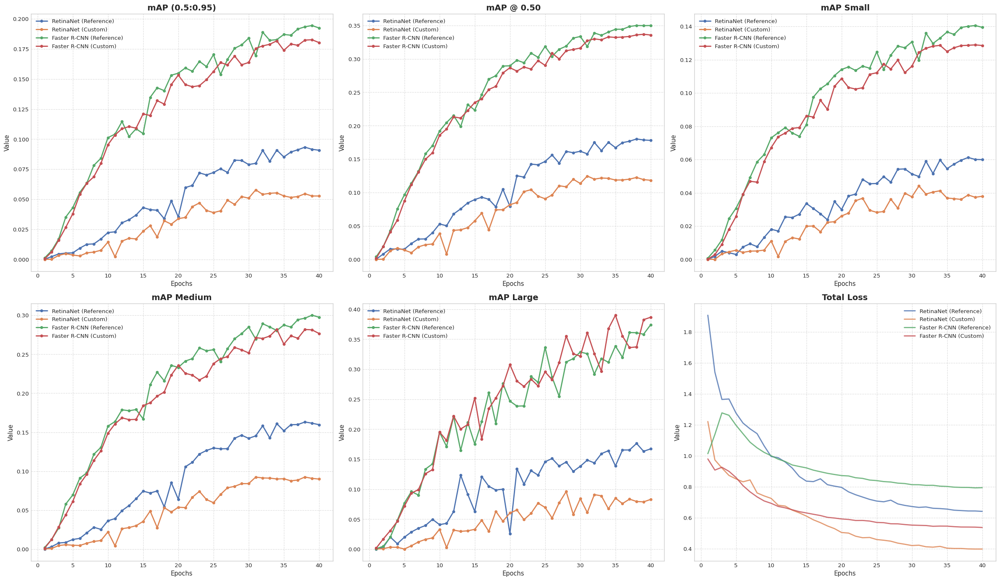

In [54]:
print("Построение графиков метрик...")
analyzer.plot_comparative_metrics()

In [55]:
print("Генерация сводной таблицы...")
summary_df = analyzer.create_summary_table()
display(summary_df)

Генерация сводной таблицы...
[Analyzer] Сводная таблица сохранена в: visdrone_final_results/final_metrics_summary.json


,Model,Best Epoch,mAP,mAP50,mAP_S,mAP_M,mAP_L,Min Loss
0,RetinaNet (Reference),38,0.0933,0.1801,0.0612,0.1632,0.1762,0.6412
1,RetinaNet (Custom),31,0.0578,0.1247,0.0441,0.0925,0.0610,0.3980
2,Faster R-CNN (Reference),39,0.1945,0.3497,0.1405,0.3001,0.3582,0.7928
3,Faster R-CNN (Custom),39,0.1827,0.3368,0.1289,0.2813,0.3826,0.5370


,Model,Best Epoch,mAP,mAP50,mAP_S,mAP_M,mAP_L,Min Loss
0,RetinaNet (Reference),38,0.0933,0.1801,0.0612,0.1632,0.1762,0.6412
1,RetinaNet (Custom),31,0.0578,0.1247,0.0441,0.0925,0.0610,0.3980
2,Faster R-CNN (Reference),39,0.1945,0.3497,0.1405,0.3001,0.3582,0.7928
3,Faster R-CNN (Custom),39,0.1827,0.3368,0.1289,0.2813,0.3826,0.5370


Визуализация работы лучшей модели...
Лидер: Faster R-CNN (Reference) (mAP: 0.1945)
[ReferenceFasterRCNN] Инициализация Reference Faster R-CNN | Классов: 9


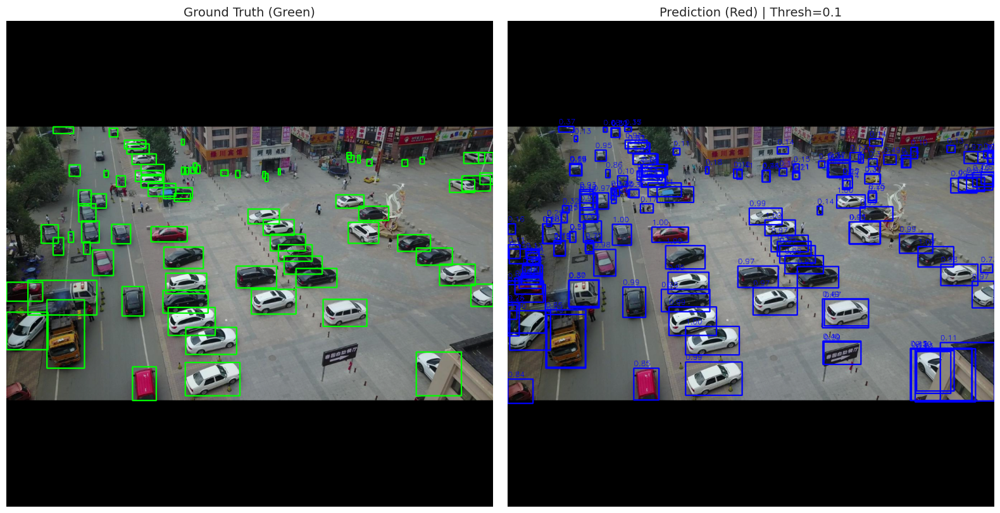

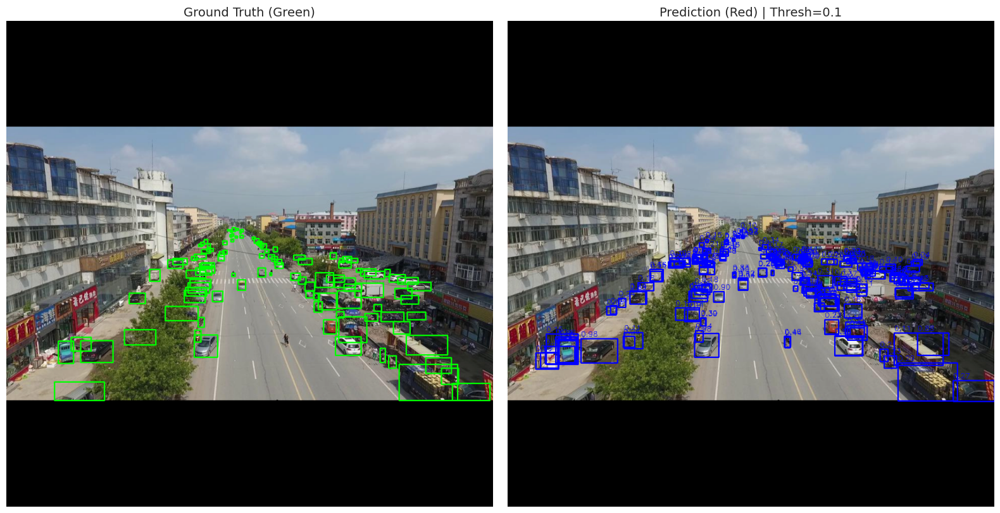

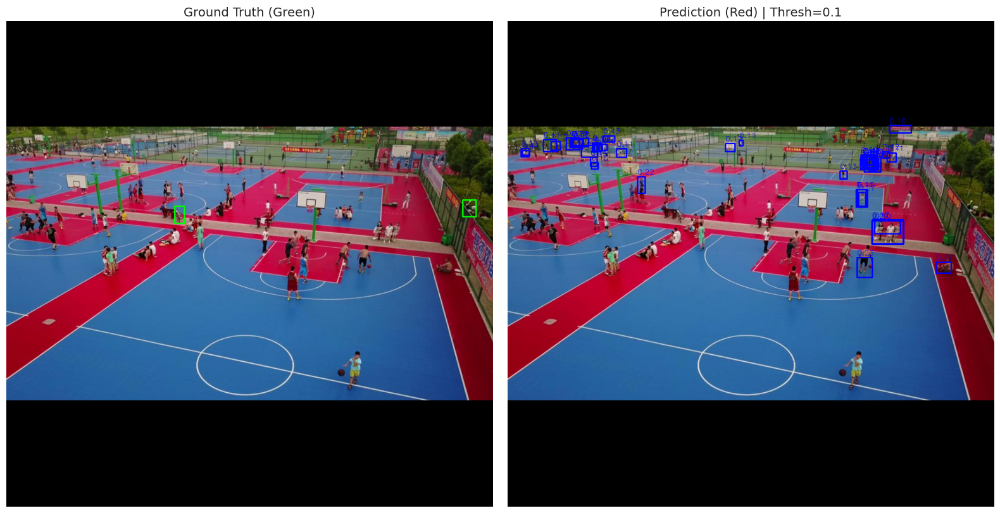

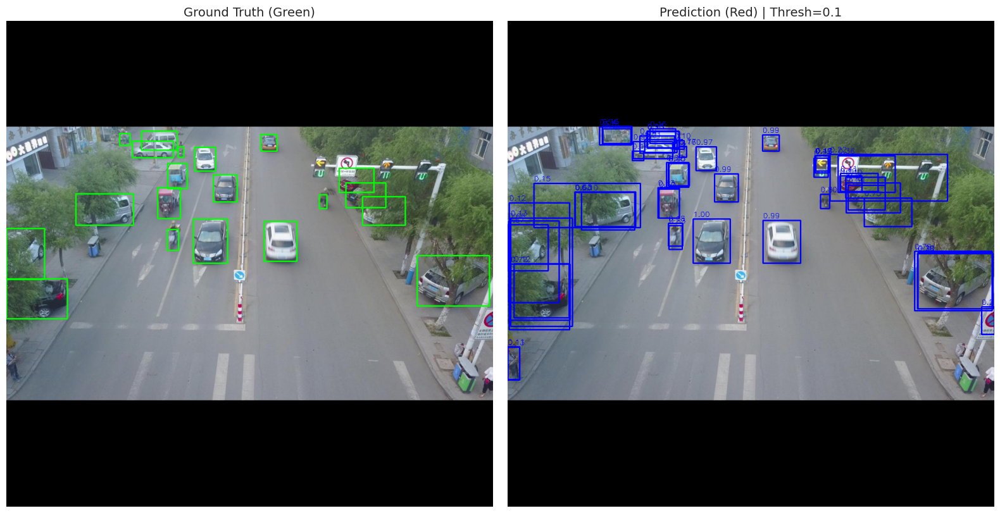

In [56]:
print("Визуализация работы лучшей модели...")

if not summary_df.empty:
    best_row = summary_df.sort_values(by="mAP", ascending=False).iloc[0]
    best_model_name = best_row["Model"]
    print(f"Лидер: {best_model_name} (mAP: {best_row['mAP']})")

    if "RetinaNet" in best_model_name:
        if "Custom" in best_model_name:
            ModelClass = CustomRetinaNet
        else:
            ModelClass = ReferenceRetinaNet
    elif "Faster" in best_model_name:
        if "Custom" in best_model_name:
            ModelClass = CustomFasterRCNN
        else:
            ModelClass = ReferenceFasterRCNN
    try:
        best_ckpt_path = experiment_paths[best_model_name] / "best_model.pth"

        viz_model = ModelClass(CONFIG).to(CONFIG["device"])

        checkpoint = torch.load(best_ckpt_path, map_location=CONFIG["device"], weights_only=False)
        viz_model.load_state_dict(checkpoint["model_state_dict"])

        analyzer.visualize_predictions(
            model=viz_model,
            dataset=val_dataset,
            device=CONFIG["device"],
            num_samples=4,
            threshold=0.1
        )
    except Exception as e:
        print(f"Не удалось визуализировать (возможно, модель не обучена): {e}")
else:
    print("Нет данных для анализа. Убедитесь, что модели обучились и создали training_log.json")